In [173]:
pwd

'/home/laklevi1/anarh/projectA/Kasare'

In [174]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import norm, probplot
from sklearn.preprocessing import QuantileTransformer

In [175]:
ls

Indices_all.csv                        navtmin_feature_importance.png
Indices_all_edited.csv                 navtmin_td.pdf
_cormatix.pdf                          navtmin_td.png
_cormatix.png                          tamprcp_feature_importance.pdf
babprcp_feature_importance.pdf         tamprcp_feature_importance.png
babprcp_feature_importance.png         tamprcp_td.pdf
babprcp_td.pdf                         tamprcp_td.png
babprcp_td.png                         tamtmax_feature_importance.pdf
babtmax_feature_importance.pdf         tamtmax_feature_importance.png
babtmax_feature_importance.png         tamtmax_td.pdf
babtmax_td.pdf                         tamtmax_td.png
babtmax_td.png                         tamtmin_feature_importance.pdf
babtmin_feature_importance.pdf         tamtmin_feature_importance.png
babtmin_feature_importance.png         tamtmin_td.pdf
babtmin_td.pdf                         tamtmin_td.png
babtmin_td.png                         veaprcp_feature_importance.pdf
boleprcp

In [176]:
df = pd.read_csv('Indices_all_edited.csv')

In [177]:
df.isnull().sum()

Unnamed: 0    0
nino34        0
amm           0
amo           0
nao           0
nino_1_2      0
nino_3        0
nino_4        0
nino3_4       0
pna           0
soi           0
tna           0
tsa           0
iod           0
pdo           0
veaprcp       0
veatmax       0
veatmin       0
waprcp        0
watmax        0
watmin        0
yenprcp       0
yentmax       0
yentmin       0
zuaprcp       0
zuatmax       0
zuatmin       0
tamprcp       0
tamtmax       0
tamtmin       0
bolgaprcp     0
bolgatmax     0
bolgatmin     0
boleprcp      0
boletmax      0
boletmin      0
babprcp       0
babtmax       0
babtmin       0
navprcp       0
navtmax       0
navtmin       0
damprcp       0
damtmax       0
damtmin       0
dtype: int64

In [178]:
df_ = df.copy()
df.drop(columns=['Unnamed: 0', 'nino34'], inplace=True)

In [179]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
amm,57.0,0.012281,1.968690,-4.1,-1.2,0.3,1.2,5.0
amo,57.0,-0.040351,0.185991,-0.4,-0.2,0.0,0.1,0.3
nao,57.0,-0.064912,0.390737,-1.3,-0.3,-0.1,0.2,0.7
nino_1_2,57.0,-0.215789,0.886363,-1.5,-0.9,-0.5,0.4,2.4
nino_3,57.0,-0.175439,0.671693,-1.3,-0.7,-0.2,0.3,1.5
nino_4,57.0,-0.233333,0.548483,-1.5,-0.7,-0.2,0.2,1.0
nino3_4,57.0,-0.149123,0.638951,-1.3,-0.6,-0.1,0.3,1.5
pna,57.0,-0.089474,0.361388,-0.8,-0.3,-0.1,0.2,0.7
soi,57.0,0.180702,0.996680,-1.5,-0.4,0.2,0.8,2.3
tna,57.0,0.094737,0.320948,-0.6,-0.2,0.1,0.3,1.0


In [180]:
# df.isnull().sum()

In [181]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import norm, probplot

class NormalityChecker:
    def __init__(self, df):
        self.df = df

    def _plot_distribution(self, ax, data, title, log_transform=False):        
        if log_transform:
            data = np.log1p(data)
            data = data.replace(-np.inf, np.nan).dropna()  # Filter out -inf values

        sns.histplot(data,
                     kde=True,
                     stat='density',
                     line_kws={'linewidth': 2, 'color': 'darkgreen'},
                     ax=ax,
                     label='Histogram')
        sns.kdeplot(data, color='blue', ax=ax, linestyle='--', label='KDE Fit')
        xmin, xmax = ax.get_xlim()
        x_values = np.linspace(xmin, xmax, 100)
        p_values = norm.pdf(x_values, np.mean(data), np.std(data))
        ax.plot(x_values, p_values, 'k-', linewidth=2, label='Normal Fit')
        ax.grid(True, linestyle='--')
        ax.legend()

        (mu, sigma) = norm.fit(data)
        ax.text(0.05, 0.95, f'$\mu={mu:.2f}$\n$\sigma={sigma:.2f}$',
                transform=ax.transAxes, fontsize=10,
                verticalalignment='top')
        ax.set_title(title)

    def _qq_plot(self, ax, data):        
        probplot(data, plot=ax)
        ax.grid(True, linestyle='--')

    def check_normality(self, cname):
        fig, (ax1, ax2) = plt.subplots(1, 2,
                                        figsize=(12, 6),
                                        dpi=80)

        self._plot_distribution(ax1, self.df[cname], f'{cname} distribution')
        self._qq_plot(ax2, self.df[cname])        

        fig.tight_layout()


# Example usage:
# normality_checker = NormalityChecker(your_dataframe)
# normality_checker.check_normality('your_column_name')


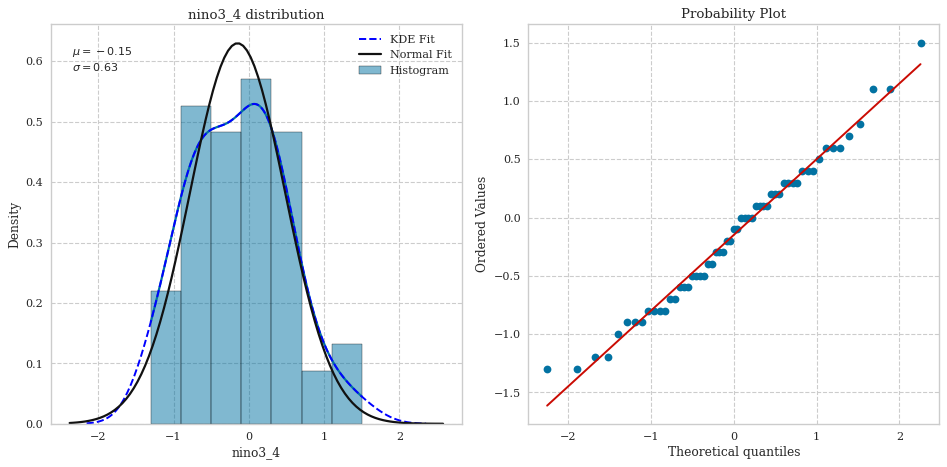

In [182]:
normality_checker = NormalityChecker(df)
transformed_column = normality_checker.check_normality('nino3_4')

In [183]:
df.columns

Index(['amm', 'amo', 'nao', 'nino_1_2', 'nino_3', 'nino_4', 'nino3_4', 'pna',
       'soi', 'tna', 'tsa', 'iod', 'pdo', 'veaprcp', 'veatmax', 'veatmin',
       'waprcp', 'watmax', 'watmin', 'yenprcp', 'yentmax', 'yentmin',
       'zuaprcp', 'zuatmax', 'zuatmin', 'tamprcp', 'tamtmax', 'tamtmin',
       'bolgaprcp', 'bolgatmax', 'bolgatmin', 'boleprcp', 'boletmax',
       'boletmin', 'babprcp', 'babtmax', 'babtmin', 'navprcp', 'navtmax',
       'navtmin', 'damprcp', 'damtmax', 'damtmin'],
      dtype='object')

In [184]:
corr_matrix = df[['amm', 'nino3_4' , 'amo', 'nao', 'nino_1_2', 'nino_3', 'nino_4','pna','soi', 'tna','iod', 'pdo', 'tsa']].corr()
# 'nino3_4',
corr_matrix 

,amm,nino3_4,amo,nao,nino_1_2,nino_3,nino_4,pna,soi,tna,iod,pdo,tsa
amm,1.000000,-0.076454,0.755343,-0.467404,-0.117777,-0.090574,0.056779,0.345934,0.179317,0.889221,-0.082109,-0.052210,-0.024643
nino3_4,-0.076454,1.000000,0.098725,0.145071,0.714667,0.936538,0.917519,0.190974,-0.907791,0.178098,0.350820,0.560116,-0.091173
amo,0.755343,0.098725,1.000000,-0.358574,0.097887,0.120996,0.222894,0.481985,0.029440,0.869889,0.103999,0.092274,0.386402
nao,-0.467404,0.145071,-0.358574,1.000000,0.182605,0.174919,0.130539,-0.302373,-0.237126,-0.464131,0.109525,0.146930,-0.182735
nino_1_2,-0.117777,0.714667,0.097887,0.182605,1.000000,0.891775,0.505791,0.302123,-0.623336,0.154122,0.369768,0.503100,0.069353
nino_3,-0.090574,0.936538,0.120996,0.174919,0.891775,1.000000,0.783607,0.242414,-0.821367,0.196926,0.417296,0.549503,0.000529
nino_4,0.056779,0.917519,0.222894,0.130539,0.505791,0.783607,1.000000,0.243242,-0.842015,0.289108,0.275237,0.570987,-0.026902
pna,0.345934,0.190974,0.481985,-0.302373,0.302123,0.242414,0.243242,1.000000,-0.221036,0.451584,-0.106214,0.529443,0.228396
soi,0.179317,-0.907791,0.029440,-0.237126,-0.623336,-0.821367,-0.842015,-0.221036,1.000000,-0.001998,-0.204121,-0.606943,0.214895
tna,0.889221,0.178098,0.869889,-0.464131,0.154122,0.196926,0.289108,0.451584,-0.001998,1.000000,0.110890,0.108408,0.302907


In [185]:
gk = df[['amm', 'nino3_4', 'amo', 'nao', 'nino_1_2', 'nino_3', 'nino_4','pna','soi', 'tna','iod', 'pdo', 'tsa']]
# 'nino3_4',


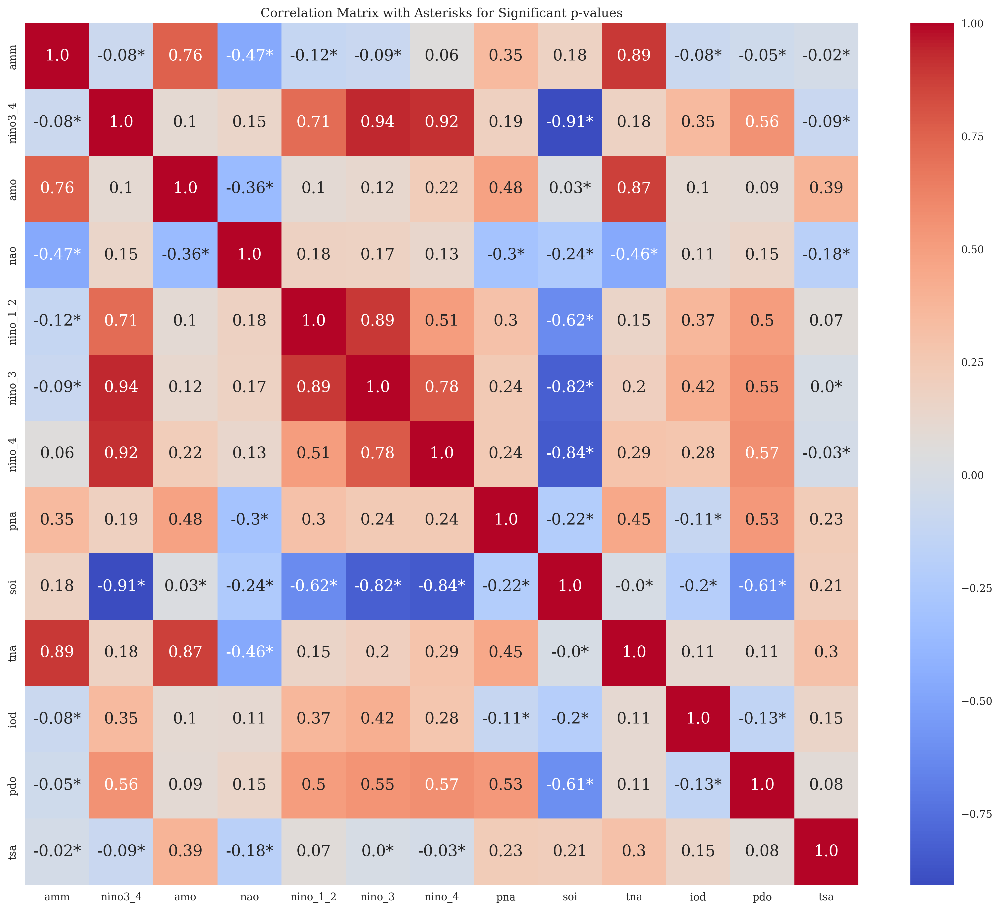

In [186]:
# Correlation matrix
corr_matrix = gk.corr()

# Calculate p-values for correlation
p_values = gk.apply(lambda x: gk.corrwith(x).apply(lambda y: '*' if y < 0.05 else ''))


# Plot heatmap with asterisks for significant p-values
plt.figure(figsize=(18, 15), dpi=300)
annot_values = corr_matrix.round(2).astype(str) + p_values
sns.heatmap(corr_matrix, annot=annot_values, cmap='coolwarm', fmt="", annot_kws={"size": 15})
plt.title('Correlation Matrix with Asterisks for Significant p-values')
# # Save the figure with additional options
# plt.savefig('{c}_feature_importance.png', 
#             bbox_inches='tight',  # Trim the white spaces around the figure
#             pad_inches=0.1,       # Padding between the figure and the edges
#             format='p',         # Save as PNG format
#             dpi=300               # Set the resolution to 300 dots per inch
#            )
# Save the figure in both PDF and PNG formats
for ext in ['pdf', 'png']:
    plt.savefig(f'_cormatix.{ext}', 
                bbox_inches='tight',  # Trim the white spaces around the figure
                pad_inches=0.1,       # Padding between the figure and the edges
                format=ext,          # Save as the current extension
                dpi=300 if ext == 'png' else None,  # Set DPI only for PNG format
                transparent=True
               )
plt.show()


* There are a few correlations with a higher absolute value than 0.70, which is often a rule-of-thumb for concern about multicollinearity. These are:
    * nino34 with nino3_4 (0.93)
    * nino34 with nino_4 (0.94)
    * nino3_4 with nino_4 (0.92)
    * amo with nino34 (0.91)
    * amo with nino3_4 (0.93)
    * amo with nino_4 (0.92)

* However, these high correlations seem to be between variations of the Nino3.4 index (nino34, nino3_4, nino_4) and the amo index. It's reasonable to expect these climate indices to be highly correlated.

Given the context of the data (climate indices), these high correlations might be less worrisome than they would be in other contexts. 

In conclusion, while the correlation matrix shows some high correlations, they seem to be between thematically related climate indices. 
However, to be more certain, it would be helpful to calculate VIFs to get a clearer picture. 

* **Variance Inflation Factor (VIF):**

In [187]:
import pandas as pd
import numpy as np
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

# Function to calculate VIF
def calculate_vif(data):
    # Add a constant column to the data
    data_with_const = add_constant(data)
    # Calculate VIF for each variable
    vif_data = pd.Series([variance_inflation_factor(data_with_const.values, i) 
                          for i in range(data_with_const.shape[1])], 
                         index=data_with_const.columns)
    return vif_data

# Calculate VIF for the dataframe
vif_results = calculate_vif(gk)

# Display the VIF results
print("Variance Inflation Factor (VIF):")
print(vif_results)


Variance Inflation Factor (VIF):
const        7.082642
amm         42.341876
nino3_4     68.586019
amo          5.088508
nao          2.047684
nino_1_2    14.014954
nino_3      57.340998
nino_4      16.221137
pna          2.556920
soi          9.349548
tna         51.052260
iod          1.741668
pdo          3.164254
tsa          7.192259
dtype: float64


This statistic measures how much the variance of an estimated coefficient is inflated due to collinearity. A VIF value greater than 10 suggests potential collinearity issues.

In [188]:
# FeatureImportances??

/home/laklevi1/anarh/ENV/new_env/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


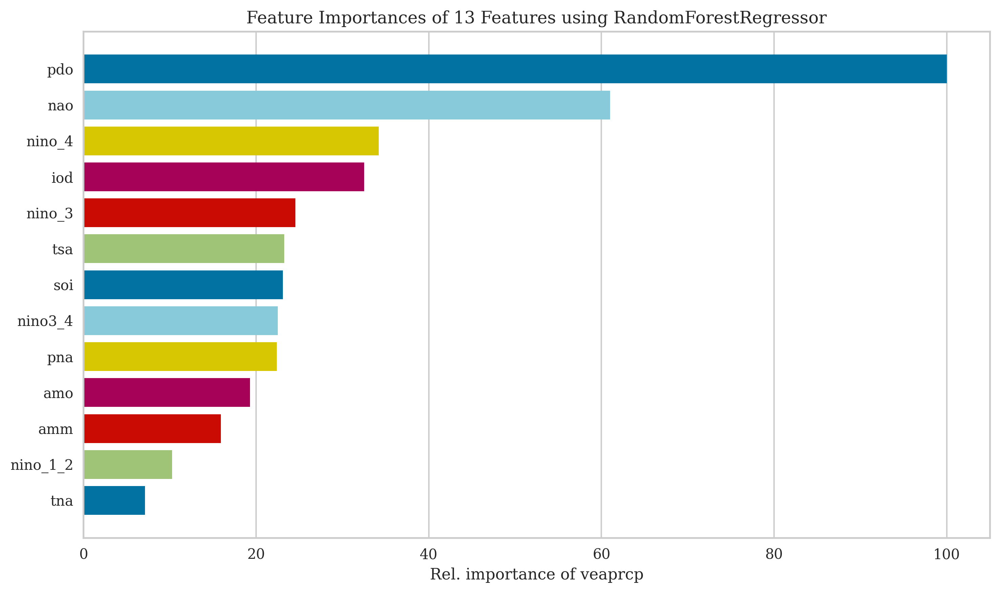

<Figure size 800x550 with 0 Axes>

/home/laklevi1/anarh/ENV/new_env/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


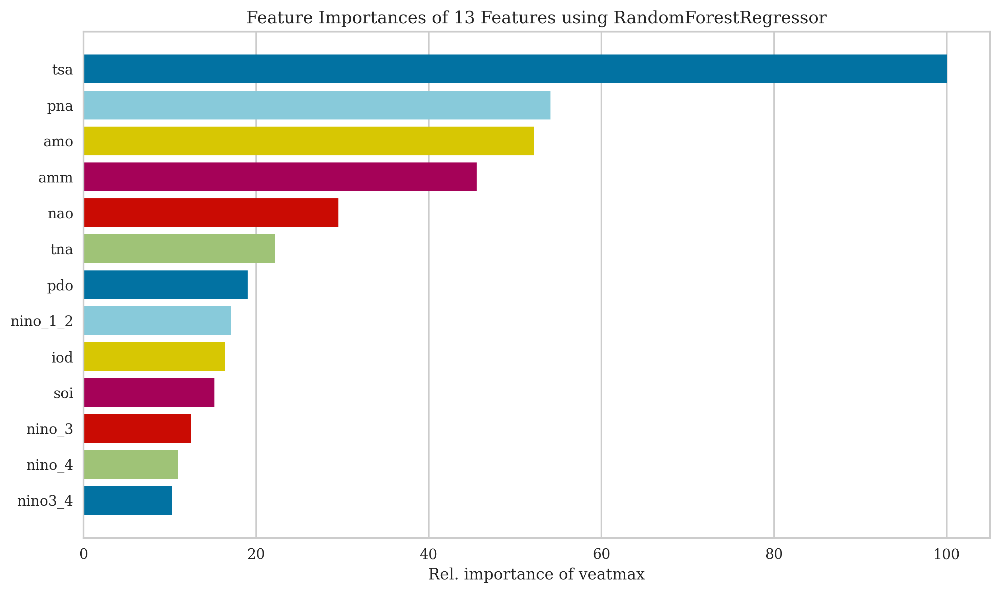

<Figure size 800x550 with 0 Axes>

/home/laklevi1/anarh/ENV/new_env/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


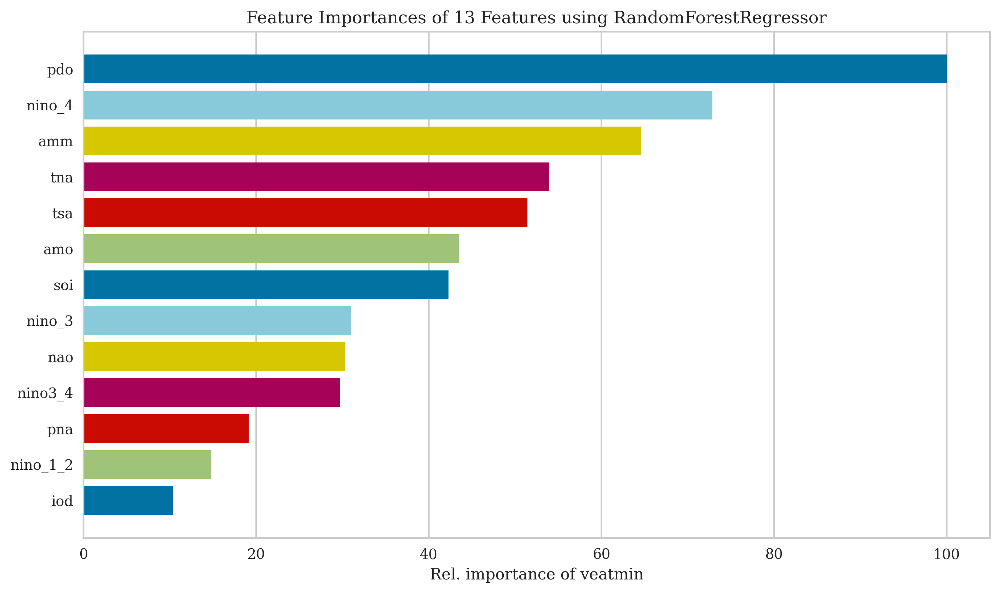

<Figure size 800x550 with 0 Axes>

/home/laklevi1/anarh/ENV/new_env/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


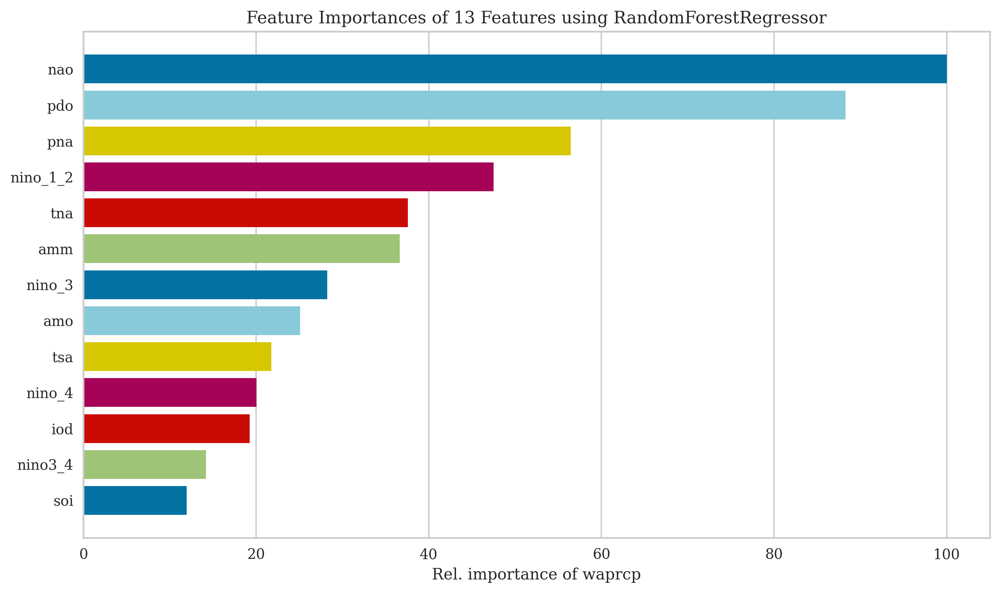

<Figure size 800x550 with 0 Axes>

/home/laklevi1/anarh/ENV/new_env/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


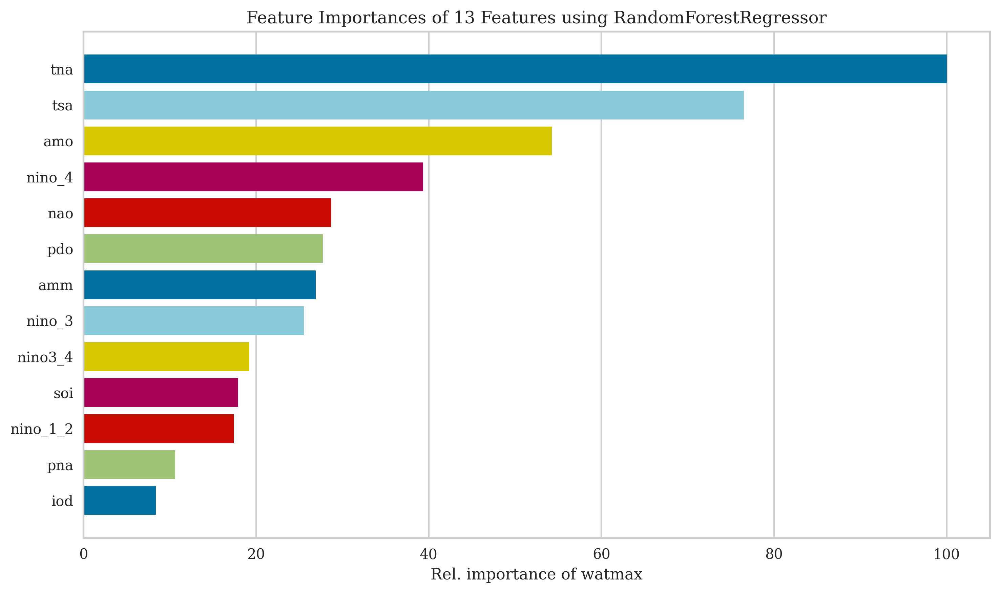

<Figure size 800x550 with 0 Axes>

/home/laklevi1/anarh/ENV/new_env/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


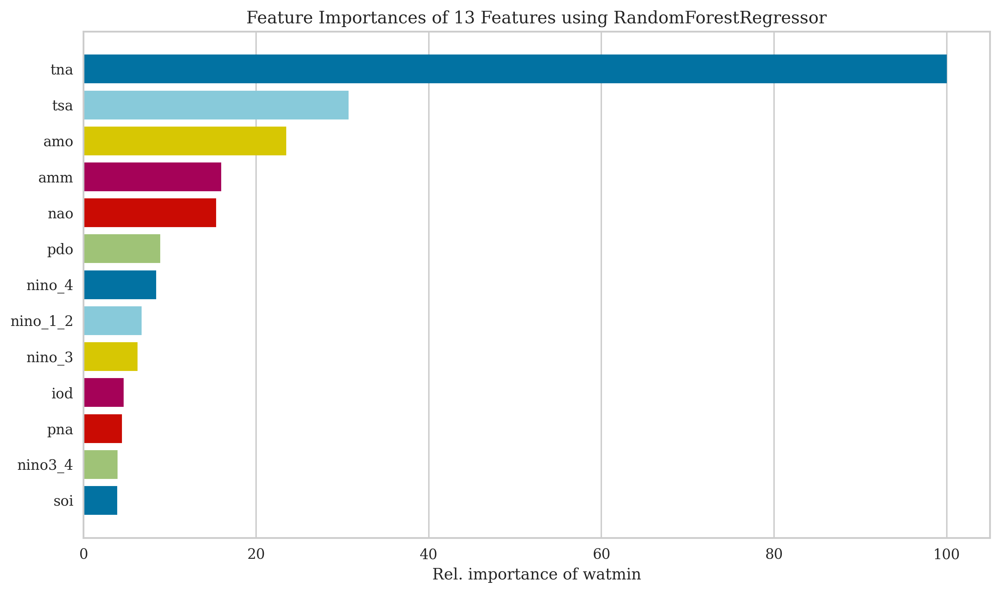

<Figure size 800x550 with 0 Axes>

/home/laklevi1/anarh/ENV/new_env/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


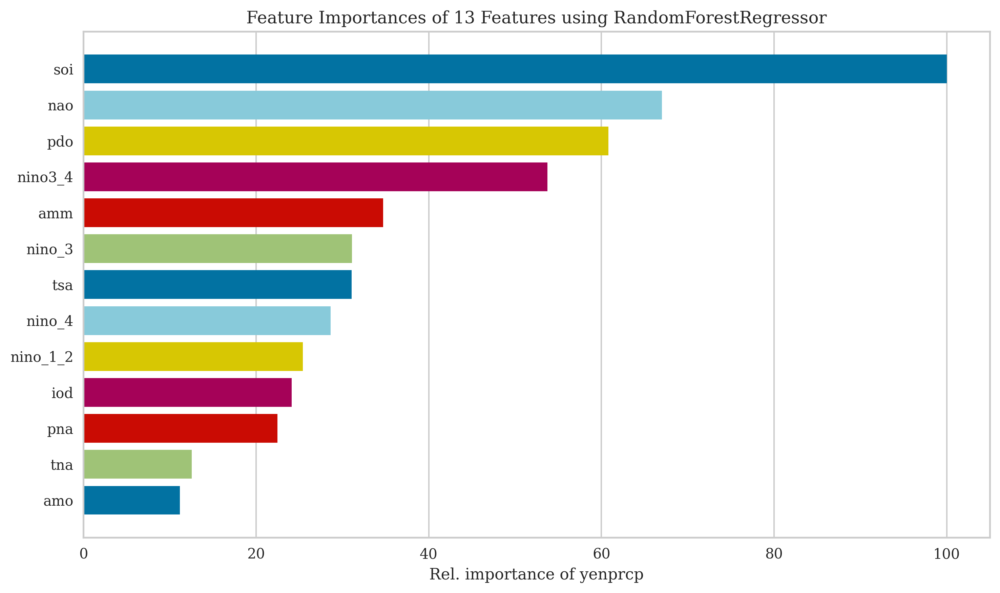

<Figure size 800x550 with 0 Axes>

/home/laklevi1/anarh/ENV/new_env/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


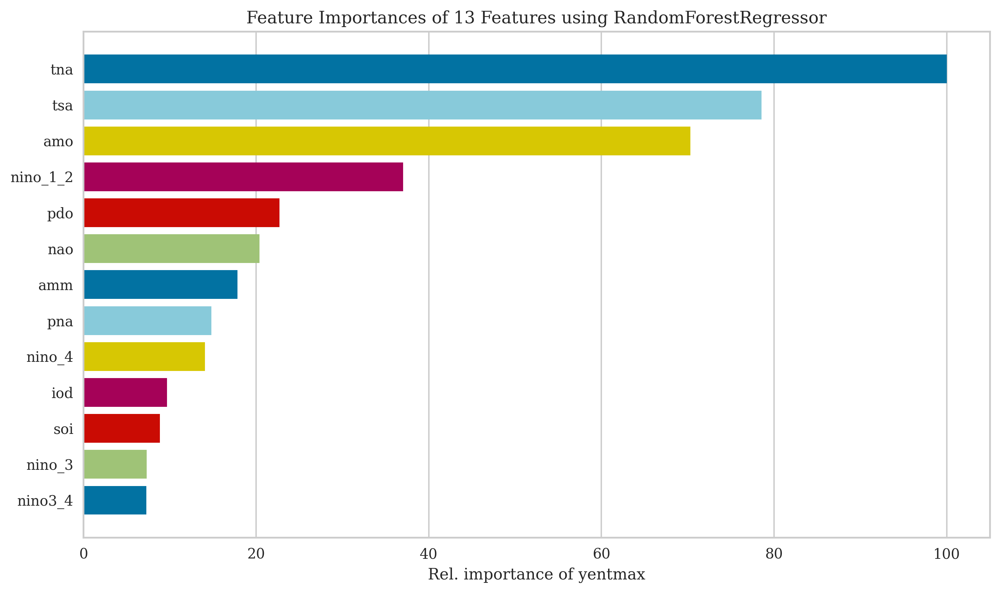

<Figure size 800x550 with 0 Axes>

/home/laklevi1/anarh/ENV/new_env/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


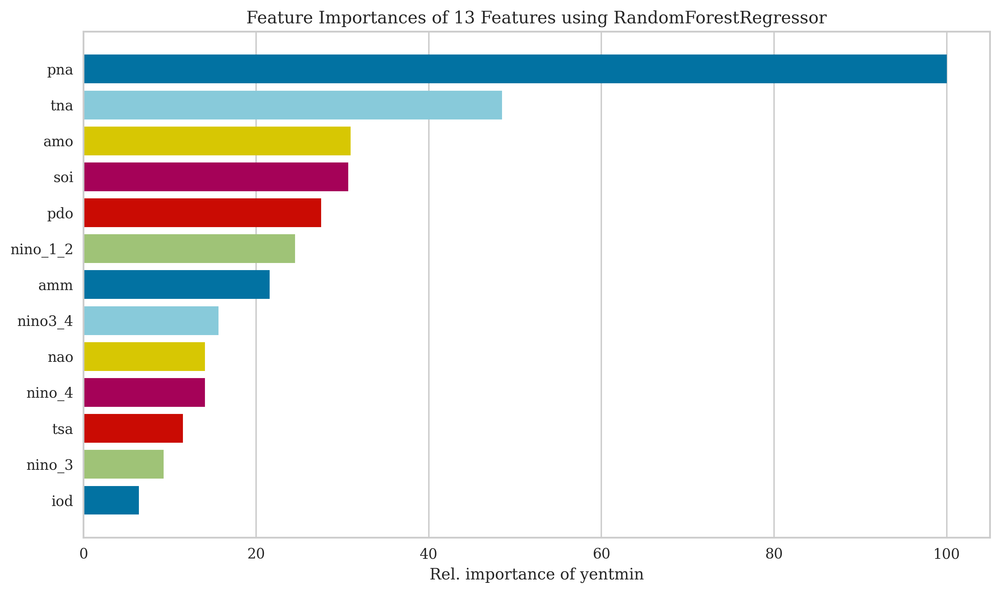

<Figure size 800x550 with 0 Axes>

/home/laklevi1/anarh/ENV/new_env/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


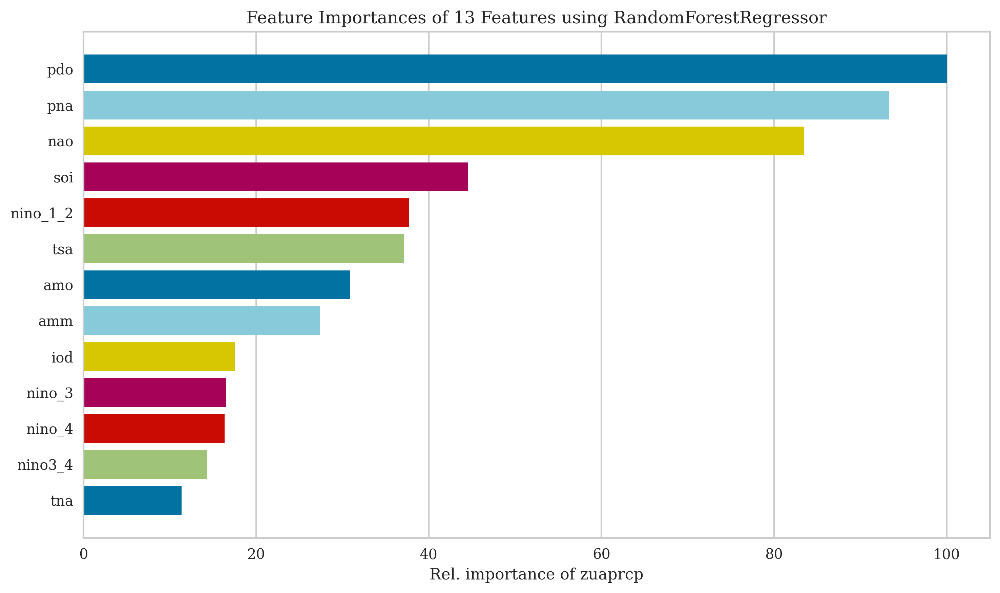

<Figure size 800x550 with 0 Axes>

/home/laklevi1/anarh/ENV/new_env/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


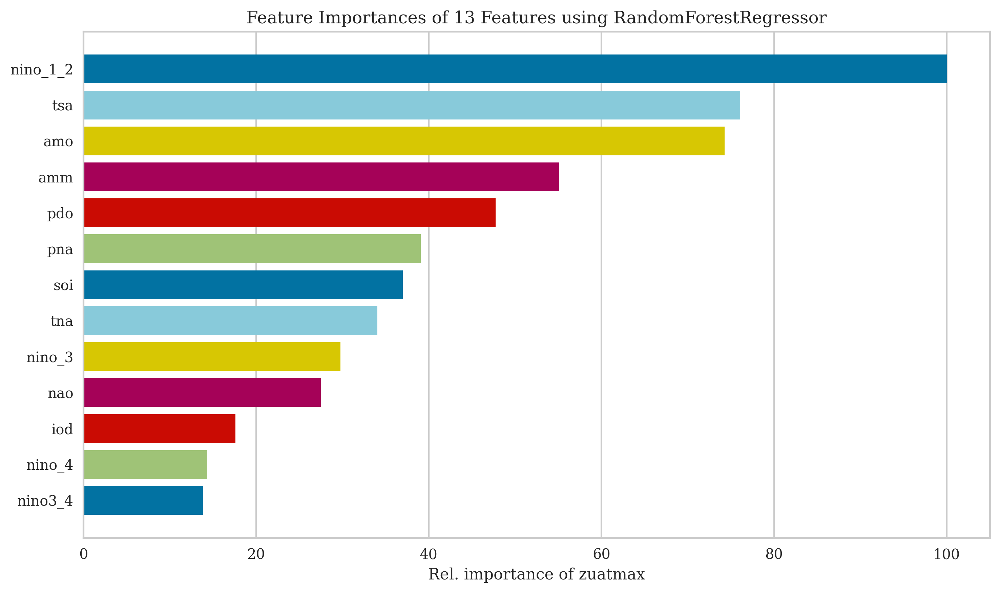

<Figure size 800x550 with 0 Axes>

/home/laklevi1/anarh/ENV/new_env/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


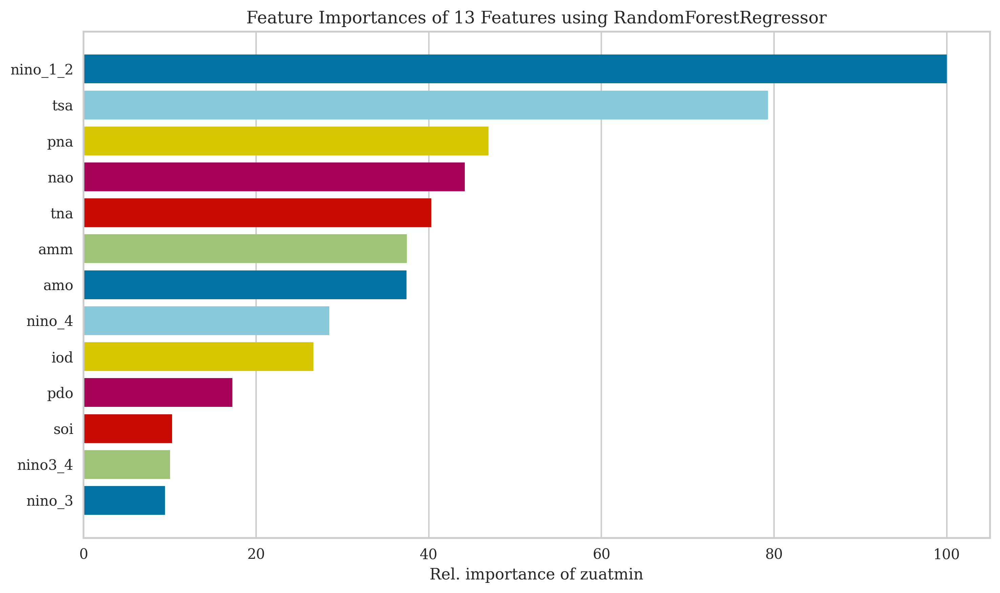

<Figure size 800x550 with 0 Axes>

/home/laklevi1/anarh/ENV/new_env/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


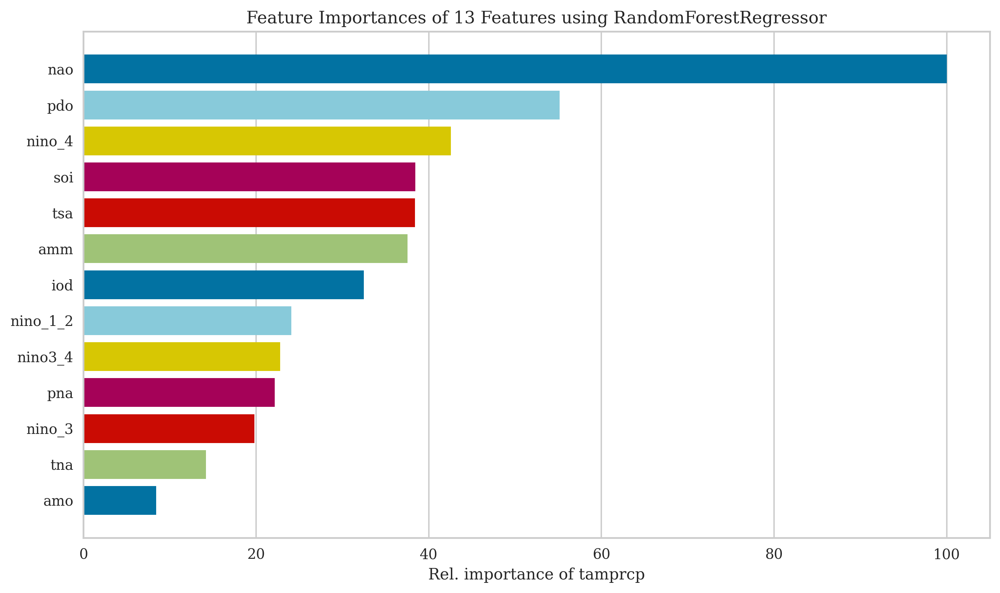

<Figure size 800x550 with 0 Axes>

/home/laklevi1/anarh/ENV/new_env/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


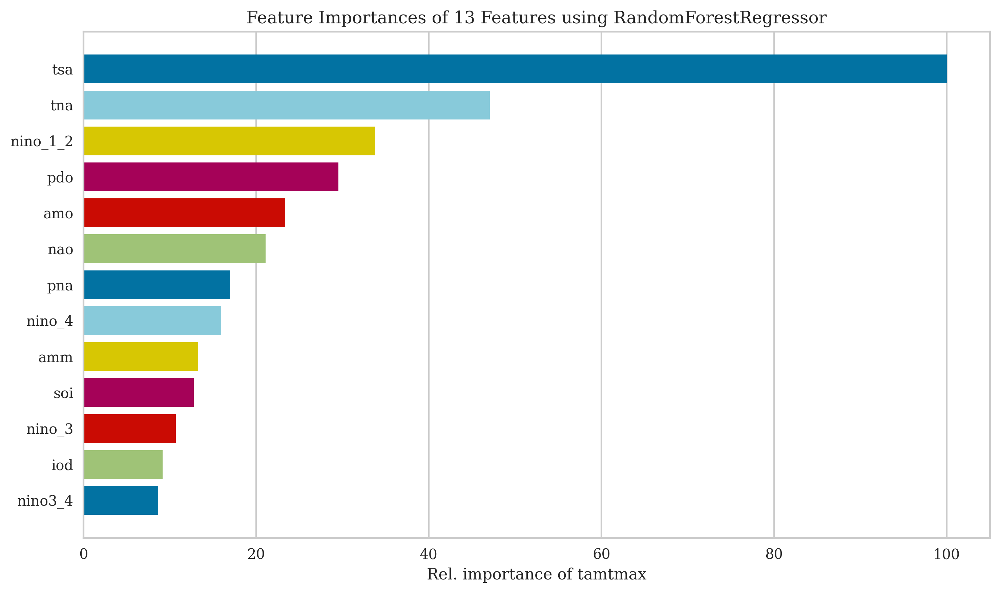

<Figure size 800x550 with 0 Axes>

/home/laklevi1/anarh/ENV/new_env/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


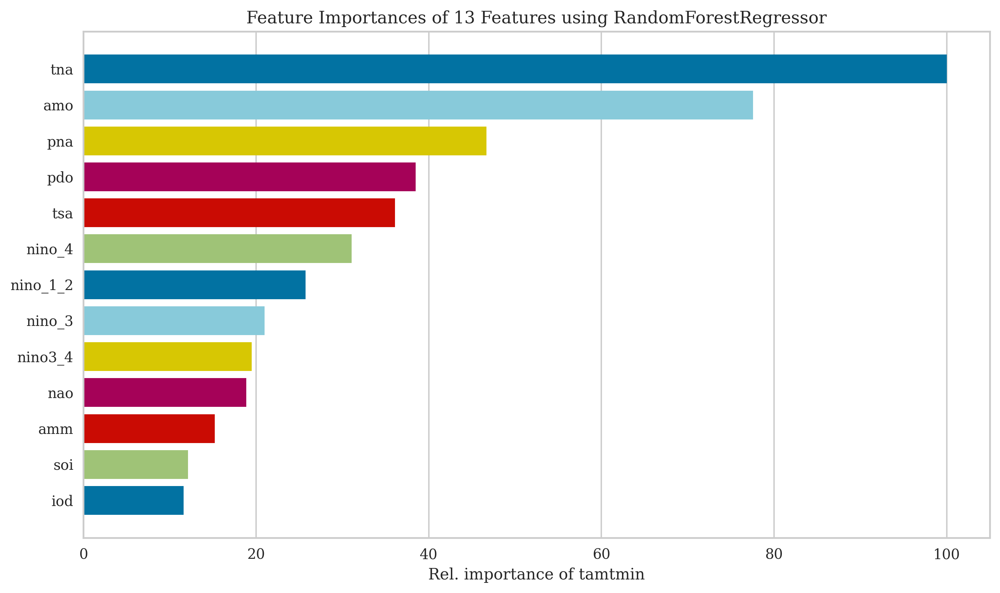

<Figure size 800x550 with 0 Axes>

/home/laklevi1/anarh/ENV/new_env/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


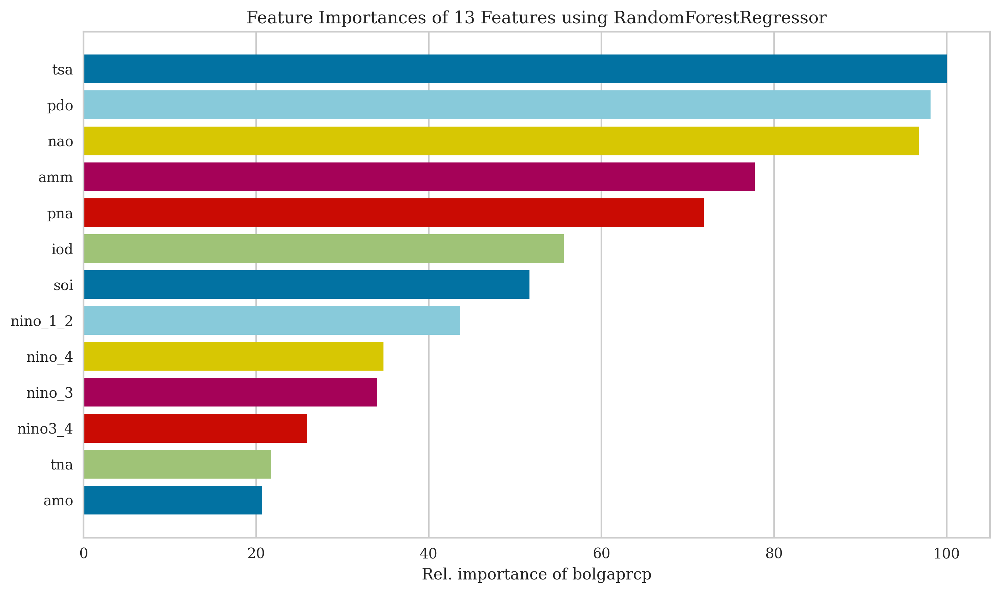

<Figure size 800x550 with 0 Axes>

/home/laklevi1/anarh/ENV/new_env/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


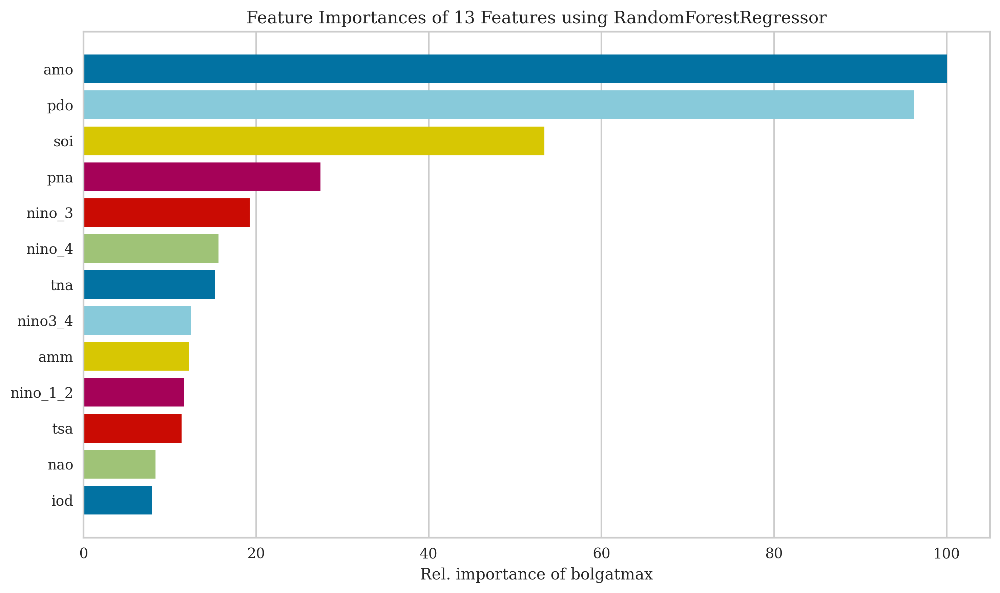

<Figure size 800x550 with 0 Axes>

/home/laklevi1/anarh/ENV/new_env/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


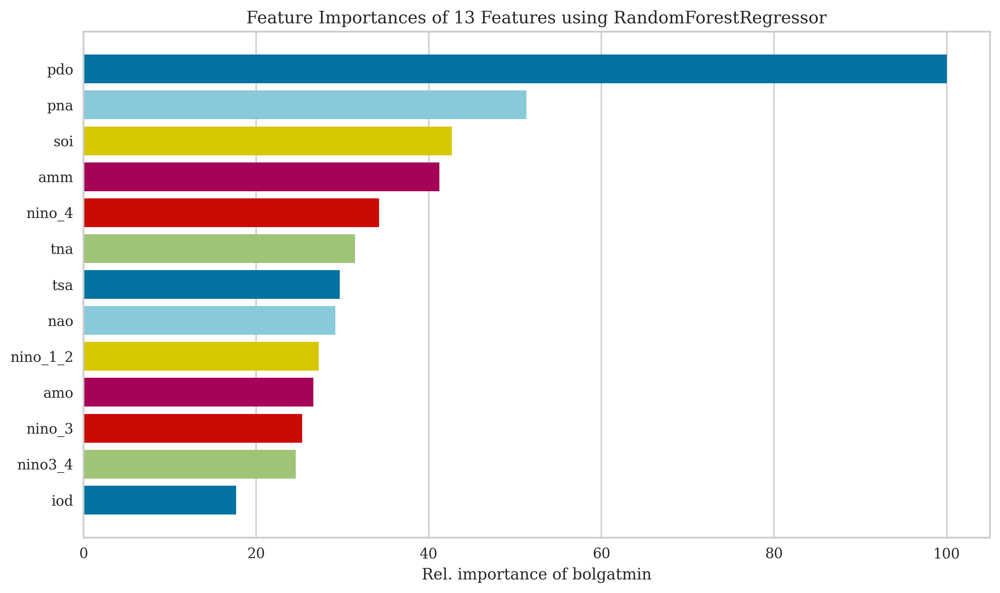

<Figure size 800x550 with 0 Axes>

/home/laklevi1/anarh/ENV/new_env/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


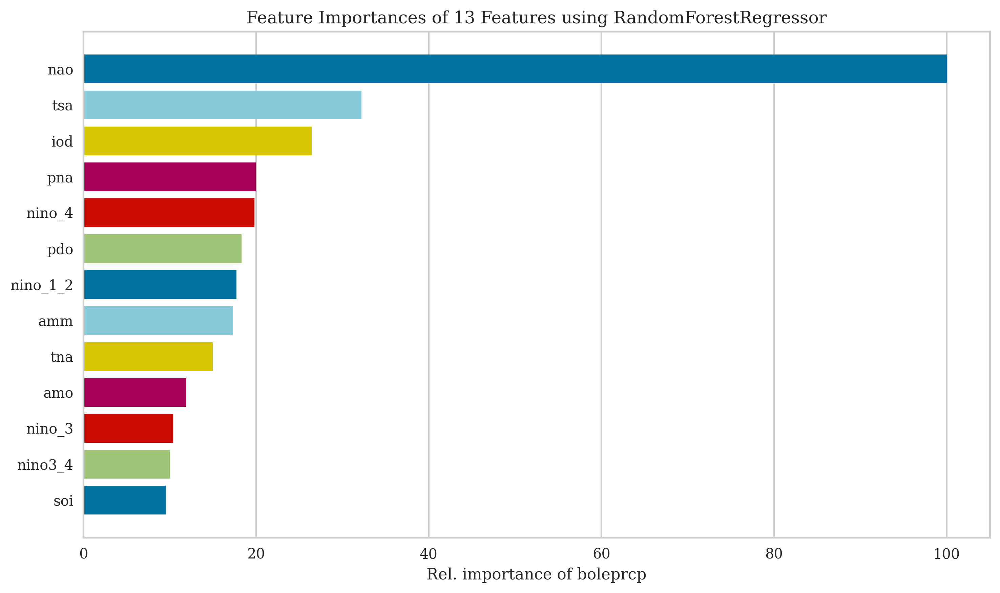

<Figure size 800x550 with 0 Axes>

/home/laklevi1/anarh/ENV/new_env/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


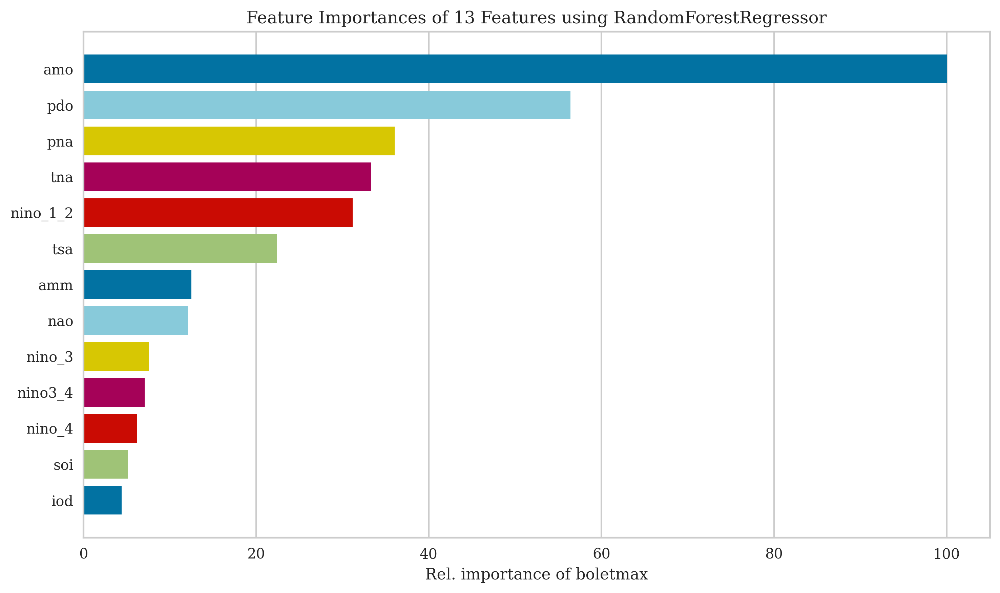

<Figure size 800x550 with 0 Axes>

/home/laklevi1/anarh/ENV/new_env/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


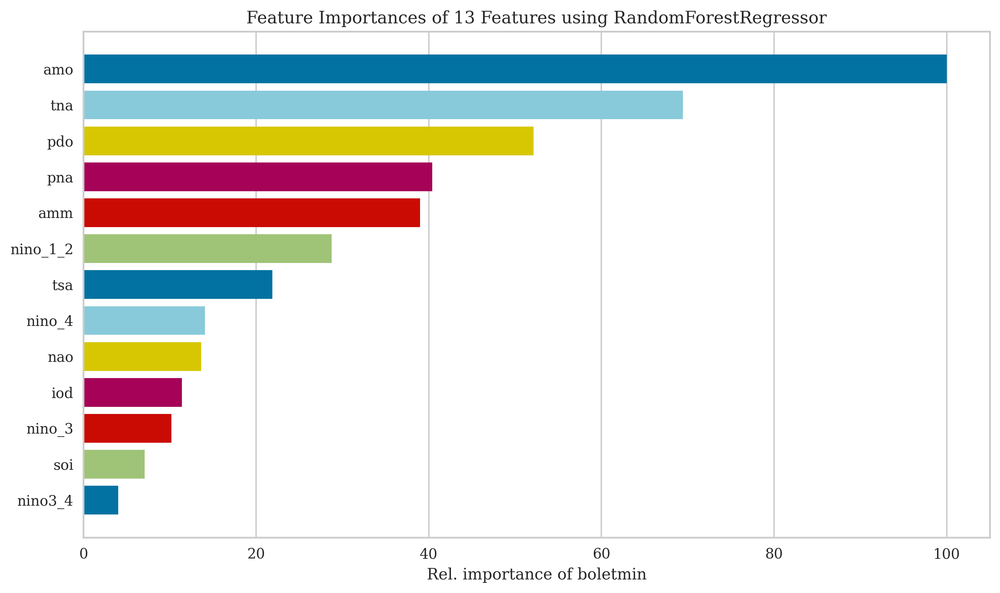

<Figure size 800x550 with 0 Axes>

/home/laklevi1/anarh/ENV/new_env/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


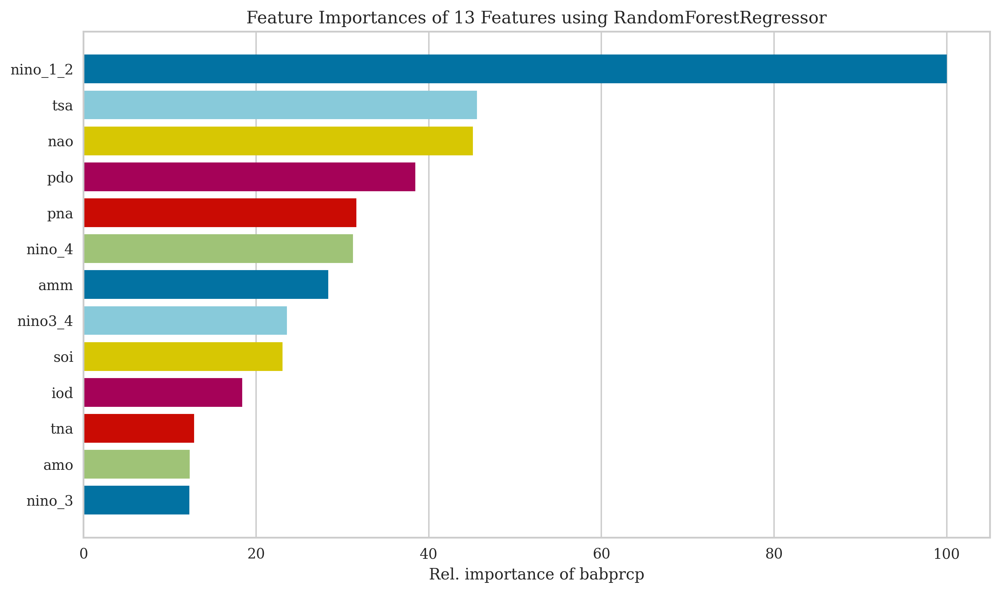

<Figure size 800x550 with 0 Axes>

/home/laklevi1/anarh/ENV/new_env/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


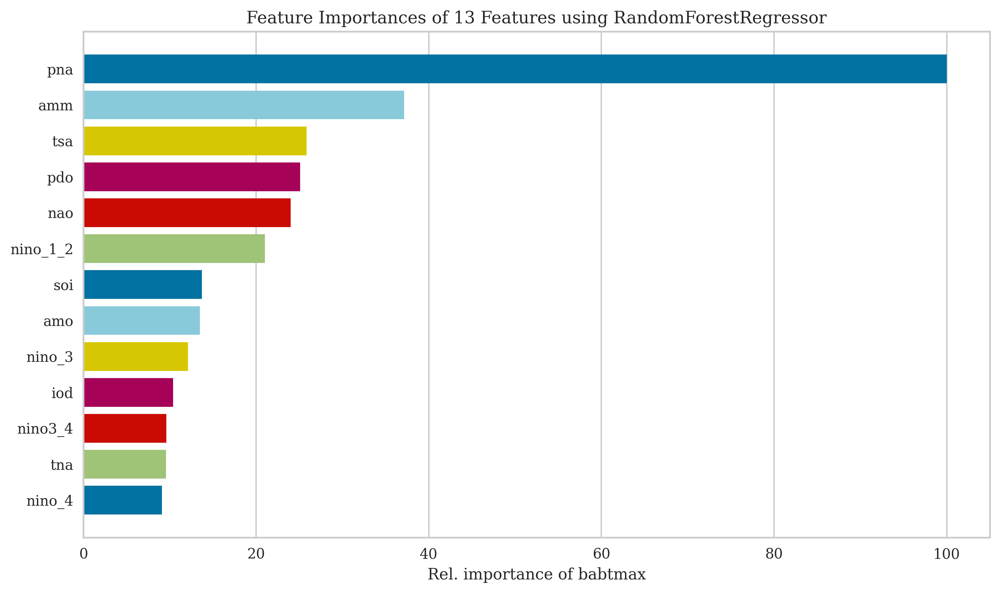

<Figure size 800x550 with 0 Axes>

/home/laklevi1/anarh/ENV/new_env/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


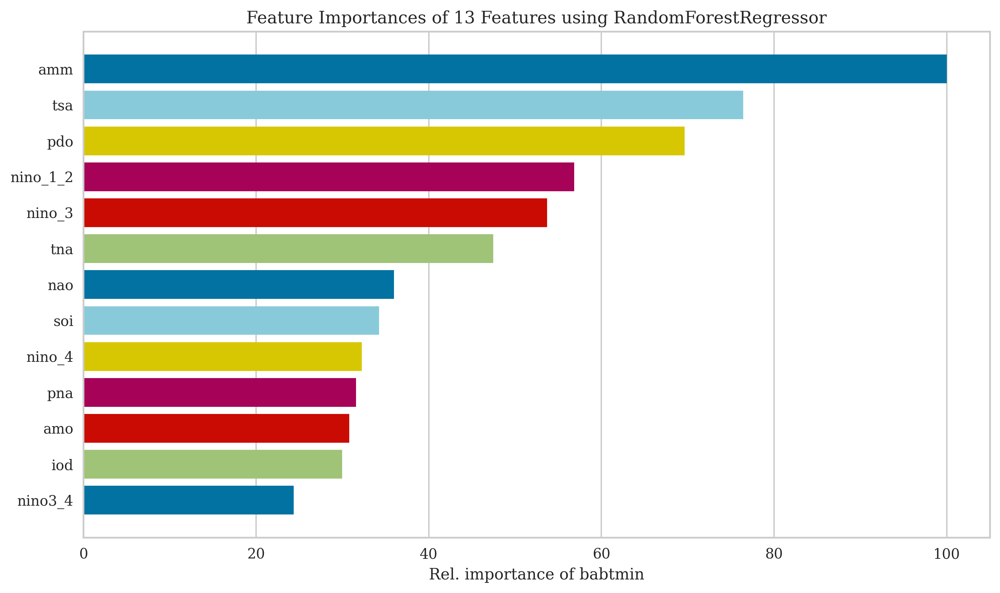

<Figure size 800x550 with 0 Axes>

/home/laklevi1/anarh/ENV/new_env/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


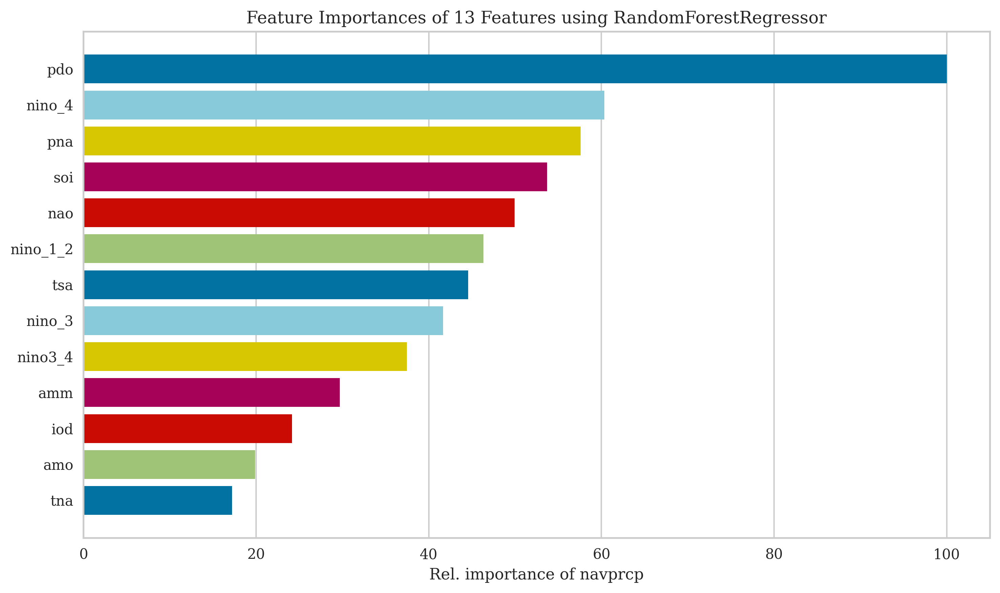

<Figure size 800x550 with 0 Axes>

/home/laklevi1/anarh/ENV/new_env/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


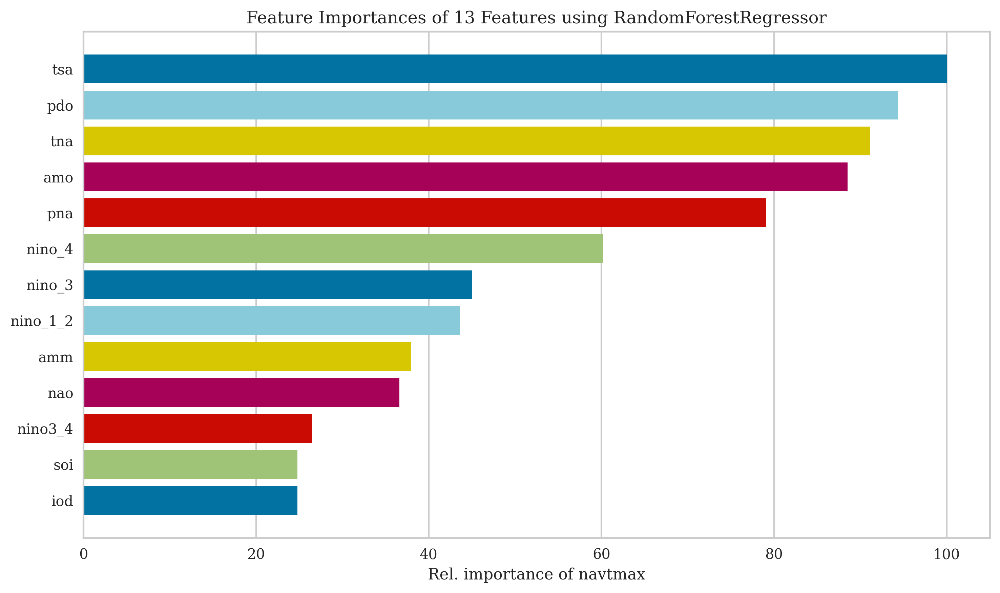

<Figure size 800x550 with 0 Axes>

/home/laklevi1/anarh/ENV/new_env/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


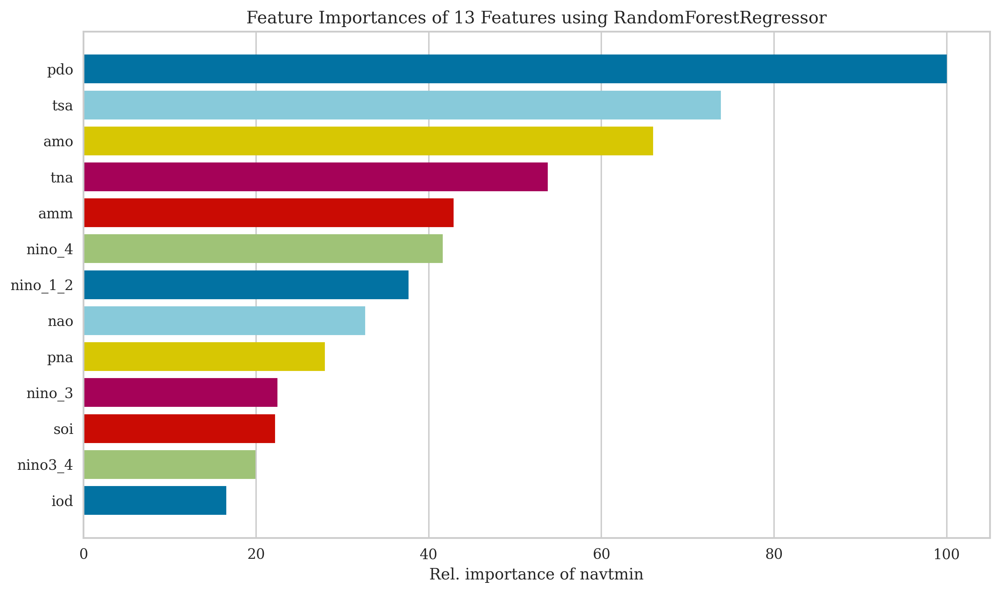

<Figure size 800x550 with 0 Axes>

/home/laklevi1/anarh/ENV/new_env/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


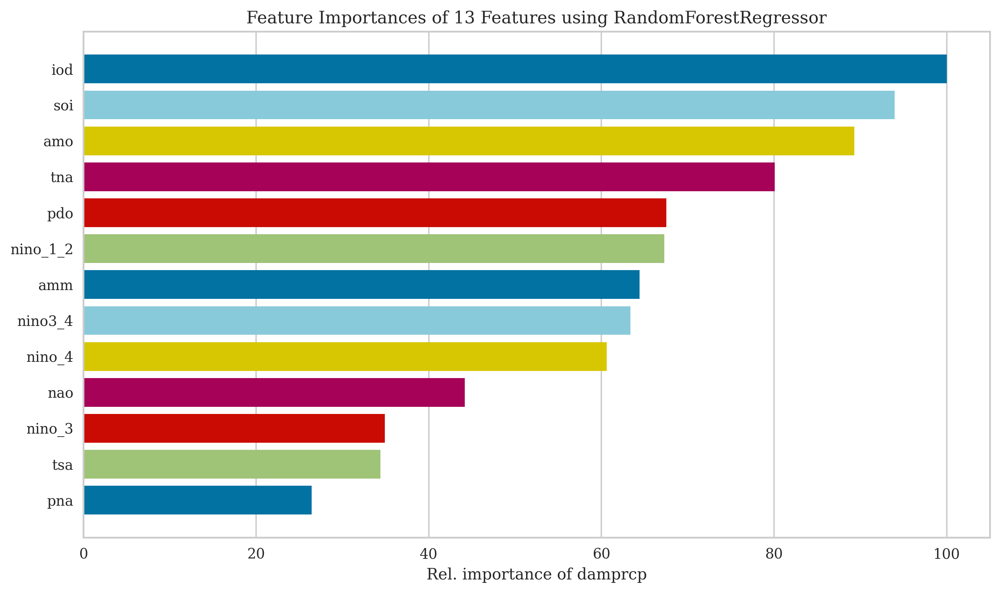

<Figure size 800x550 with 0 Axes>

/home/laklevi1/anarh/ENV/new_env/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


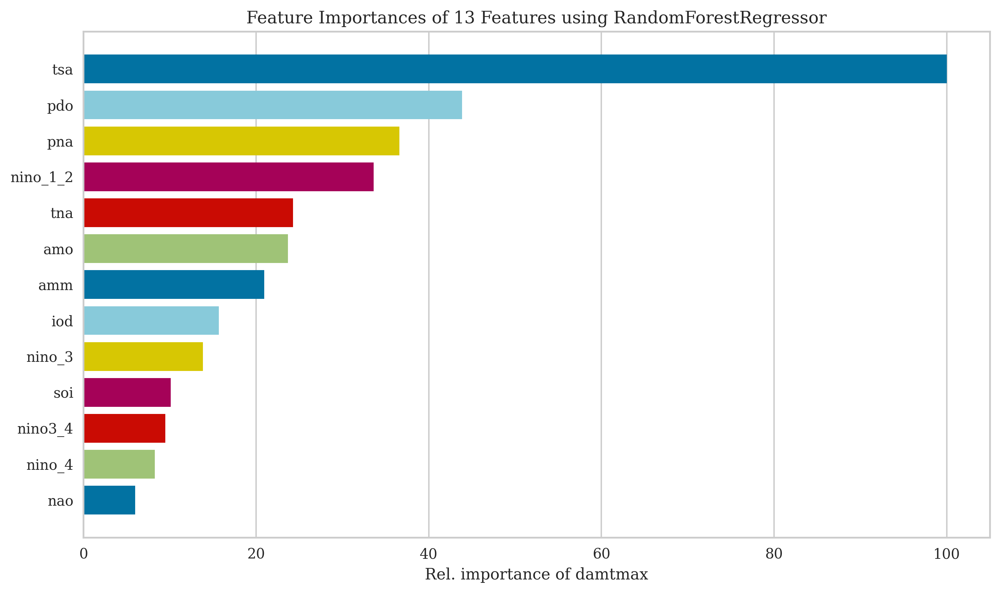

<Figure size 800x550 with 0 Axes>

/home/laklevi1/anarh/ENV/new_env/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


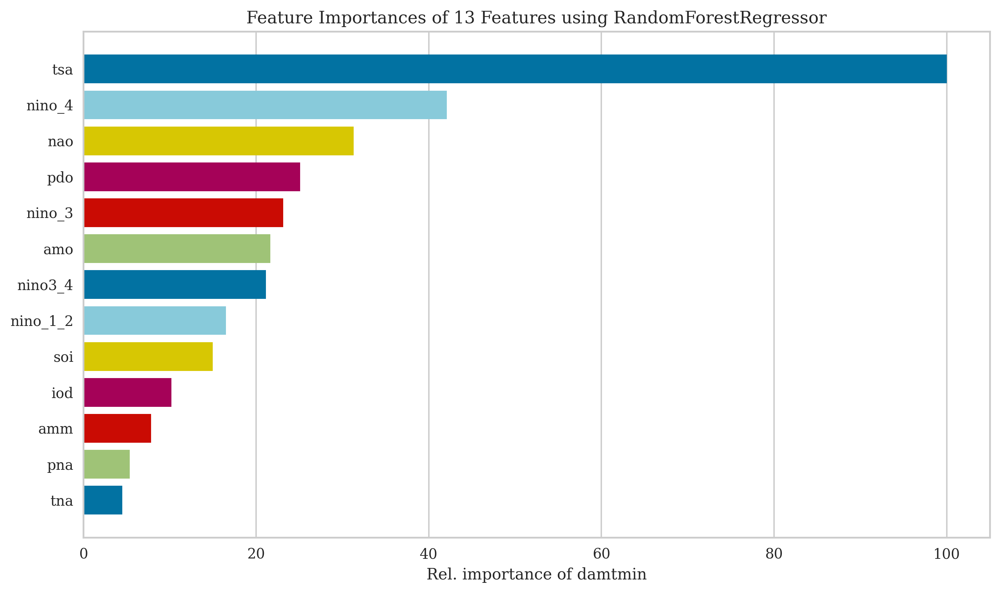

<Figure size 800x550 with 0 Axes>

In [189]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor as rfR
from yellowbrick.model_selection import FeatureImportances
plt.rcParams['font.family'] = 'DejaVu Serif'

# Generate some example data (replace with your dataset)
np.random.seed(42)
X = gk

for c in ['veaprcp',
       'veatmax', 'veatmin', 'waprcp', 'watmax', 'watmin', 'yenprcp',
       'yentmax', 'yentmin', 'zuaprcp', 'zuatmax', 'zuatmin', 'tamprcp',
       'tamtmax', 'tamtmin', 'bolgaprcp', 'bolgatmax', 'bolgatmin', 'boleprcp',
       'boletmax', 'boletmin', 'babprcp', 'babtmax', 'babtmin', 'navprcp',
       'navtmax', 'navtmin', 'damprcp', 'damtmax', 'damtmin']:
    y = df[c]

    # Create a Random Forest model
    model = rfR(n_estimators=100, random_state=42)

    # Fit the model
    model.fit(X, y)

    # Visualize feature importances
    fig, ax = plt.subplots(figsize=(10, 6), dpi=300)
    viz = FeatureImportances(model, ax=ax, xlabel='Rel. importance of ' + c)
    viz.fit(X, y)
    viz.show()

    # Save the figure with additional options
    # plt.savefig(f'{c}_feature_importance.png', 
    #             bbox_inches='tight',  # Trim the white spaces around the figure
    #             pad_inches=0.1,       # Padding between the figure and the edges
    #             format='png',         # Save as PNG format
    #             dpi=300               # Set the resolution to 300 dots per inch
    #            )
    
    # Save the figure in both PDF and PNG formats
    for ext in ['pdf', 'png']:
        plt.savefig(f'{c}_feature_importance.{ext}', 
                    bbox_inches='tight',  # Trim the white spaces around the figure
                    pad_inches=0.1,       # Padding between the figure and the edges
                    format=ext,          # Save as the current extension
                    dpi=300 if ext == 'png' else None,  # Set DPI only for PNG format
                    transparent=True
                   )

    plt.show()


In [190]:
# !pip install scikit-learn==0.18.2

In [191]:
# from sklearn.ensemble import RandomForestRegressor

In [192]:
import statsmodels.api as sm
from sklearn.preprocessing import StandardScaler

In [193]:
Xnew = gk
# ytransformed_column = df['damtmin']

In [194]:
# Standardize the features
scaler = StandardScaler()
# Xnew = X.drop(columns=['Distance nearest to human settlement', 'Width', 'Perimeter (m)', 'Depth (cm)', 'Length'])

X_standardized = scaler.fit_transform(Xnew)
# Convert standardized features to DataFrame with meaningful column names Standardized_
columns_standardized = [f'{col}' for col in Xnew.columns]
X_standardized_df = pd.DataFrame(X_standardized, columns=columns_standardized)

# Add a constant term to the standardized features matrix
X_standardized_df = sm.add_constant(X_standardized_df)

for c in [
           'babprcp',
           'boleprcp',
           'bolgaprcp',
           'damprcp',
           'navprcp',            
           'tamprcp',
           'veaprcp',
           'waprcp',        
           'yenprcp',
           'zuaprcp',
           'babtmax',
           'boletmax',
           'bolgatmax',
           'damtmax',
           'navtmax',
           'tamtmax',
           'veatmax',
           'watmax',
           'yentmax',
           'zuatmax',
           'babtmin',
           'boletmin',
           'bolgatmin',
           'damtmin',
           'navtmin',
           'tamtmin',
           'veatmin',         
           'watmin',           
           'yentmin',          
           'zuatmin',         
          ]:
    ytransformed_column = df[c]
    # Fit the OLS model with standardized features
    model_standardized = sm.OLS(ytransformed_column, X_standardized_df)
    results_standardized = model_standardized.fit()

    # Display the summary of the regression with standardized features
    print(results_standardized.summary(), '\n')
   

                            OLS Regression Results                            
Dep. Variable:                babprcp   R-squared:                       0.229
Model:                            OLS   Adj. R-squared:                 -0.004
Method:                 Least Squares   F-statistic:                    0.9840
Date:                Thu, 11 Apr 2024   Prob (F-statistic):              0.482
Time:                        10:13:58   Log-Likelihood:                -404.27
No. Observations:                  57   AIC:                             836.5
Df Residuals:                      43   BIC:                             865.1
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        907.7895     44.385     20.453      0.0

It table above summarizes the results of a linear regression analysis performed using Ordinary Least Squares (OLS) method. Let's break down the table row by row:

* **Dep. Variable:** This refers to the dependent variable, also known as the response variable, which is being predicted by the model. In this case, the dependent variable is `damtmin`.
* **Model:** This specifies the type of model used, which is OLS (Ordinary Least Squares) regression.
* **Method:** This indicates the method used for estimation, which is Least Squares. 

* **No. Observations:** This indicates the number of observations used in the analysis, which is 57.
* **Df Residuals:** This represents the degrees of freedom for the residuals, which is 43. The degrees of freedom is a statistical concept related to the number of independent pieces of information in your data. 
* **Df Model:** This represents the degrees of freedom for the model, which is 13. This reflects the number of explanatory variables (excluding the intercept) used in the model.
* **Covariance Type:** This specifies the type of covariance matrix used to estimate the variance of the coefficients. 

The bottom portion of the table shows the coefficients for each explanatory variable included in the model:

* **const:** This represents the intercept term, which is the estimated value of the dependent variable when all the explanatory variables are zero. The coefficient for the constant term is 21.0649.
* **amm:** This is an explanatory variable with a coefficient of -0.4508 and a p-value of 0.038. The p-value lower than 0.05 suggests the coefficient is statistically significant. A negative coefficient means there's a negative linear relationship between this variable and the dependent variable. 
* **nino34, nino3_4, amo, nao, nino_1_2, nino_3, nino_4, pna, soi, tna, iod, pdo:** These are other explanatory variables included in the model. Their coefficients and p-values are listed in the table. A positive coefficient indicates a positive linear relationship between the variable and the dependent variable, while a negative coefficient indicates a negative linear relationship. The p-value associated with each coefficient reflects its statistical significance.

* **R-squared:** This value, 0.447, represents the R-squared statistic, which is a measure of how well the variation in the dependent variable is explained by the independent variables in the model. An R-squared of 0.447 means that 44.7% of the variation in `damtmin` is explained by the explanatory variables included in the model.
* **Adj. R-squared:** This value, 0.279, represents the adjusted R-squared statistic, which is a modification of R-squared that takes into account the number of explanatory variables in the model. It tends to be a more reliable estimate of the model's explanatory power.
* **F-statistic:** This statistic, 2.668, along with its p-value (0.00784), is used to test the null hypothesis that all the regression coefficients are zero. A p-value lower than 0.05 suggests we can reject the null hypothesis, implying that at least one of the explanatory variables has a statistically significant relationship with the dependent variable.

Overall, the table summarizes the results of an OLS regression analysis where the model attempts to explain and predict variations in `damtmin` based on several explanatory variables. The R-squared value suggests that the model explains a moderate portion of the variance in the dependent variable.  

In [195]:
# !pip install --upgrade pip

In [196]:
def co_standard_deviation(x_values, y_values):
    """
    Calculate the co-standard deviation (pooled standard deviation or standard error of the mean difference)
    between two sets of paired data points.

    Parameters:
    - x_values: Array-like, containing the values of the first set of data points.
    - y_values: Array-like, containing the values of the second set of data points.

    Returns:
    - co_std: Co-standard deviation calculated from the input data.
    """

    # Check if the input arrays have the same length
    if len(x_values) != len(y_values):
        raise ValueError("The input arrays must have the same length.")

    # Calculate the means of the two sets of data points
    mean_x = np.mean(x_values)
    mean_y = np.mean(y_values)

    # Calculate the sum of squared differences from the means for each set
    sum_of_squared_differences = np.sum((x_values - mean_x)**2 + (y_values - mean_y)**2)

    # Calculate the co-standard deviation
    co_std = np.sqrt(sum_of_squared_differences / len(x_values))

    return co_std

In [197]:
def centered_root_mean_square_difference(x_values, y_values):
    """
    Calculate the Centered Root Mean Square Difference (CRMSD) between two sets of paired data points.

    Parameters:
    - x_values: Array-like, containing the values of the first set of data points.
    - y_values: Array-like, containing the values of the second set of data points.

    Returns:
    - crmsd: CRMSD calculated from the input data.
    """

    # Check if the input arrays have the same length
    if len(x_values) != len(y_values):
        raise ValueError("The input arrays must have the same length.")

    # Calculate the means of the two sets of data points
    mean_x = np.mean(x_values)
    mean_y = np.mean(y_values)

    # Calculate the centered differences between the paired data points
    centered_differences = (x_values - mean_x) - (y_values - mean_y)

    # Calculate the squared differences
    squared_differences = centered_differences**2

    # Calculate the mean of the squared differences
    mean_squared_differences = np.mean(squared_differences)

    # Calculate the CRMSD
    crmsd = np.sqrt(mean_squared_differences)

    return crmsd

The correlation coefficient, often denoted by $ r $, is a statistical measure that describes the strength and direction of a linear relationship between two variables. It ranges from -1 to 1, where:

- $ r = 1 $: Indicates a perfect positive linear relationship.
- $ r = -1 $: Indicates a perfect negative linear relationship.
- $ r = 0 $: Indicates no linear relationship between the variables.

The formula for the correlation coefficient between two variables $ X $ and $ Y $ with $ n $ data points is given by:

$$
r = \frac{\sum_{i=1}^{n} (x_i - \bar{x}) (y_i - \bar{y})}{\sqrt{\sum_{i=1}^{n} (x_i - \bar{x})^2} \sqrt{\sum_{i=1}^{n} (y_i - \bar{y})^2}}
$$

Where:
- $ x_i $ and $ y_i $ are the individual data points of variables $ X $ and $ Y $, respectively.
- $ \bar{x} $ and $ \bar{y} $ are the means of variables $ X $ and $ Y $, respectively.

This formula calculates the covariance between the two variables and normalizes it by dividing by the product of their standard deviations to obtain the correlation coefficient.

In [198]:
import numpy as np

def correlation_coefficient(x_values, y_values):
    """
    Calculate the correlation coefficient between two variables.

    Parameters:
    - x_values: Array-like, containing the values of the first variable.
    - y_values: Array-like, containing the values of the second variable.

    Returns:
    - r: Correlation coefficient calculated from the input data.
    """

    # Check if the input arrays have the same length
    if len(x_values) != len(y_values):
        raise ValueError("The input arrays must have the same length.")

    # Calculate the means of the two variables
    mean_x = np.mean(x_values)
    mean_y = np.mean(y_values)

    # Calculate the covariance between the two variables
    covariance = np.sum((x_values - mean_x) * (y_values - mean_y))

    # Calculate the standard deviations of the two variables
    std_x = np.sqrt(np.sum((x_values - mean_x)**2))
    std_y = np.sqrt(np.sum((y_values - mean_y)**2))

    # Calculate the correlation coefficient
    r = covariance / (std_x * std_y)

    return r

# # Example usage:
# x_values = [1, 2, 3, 4, 5]
# y_values = [2, 3, 4, 5, 6]

# correlation = correlation_coefficient(x_values, y_values)
# print("Correlation coefficient:", correlation)


In [199]:
gk.shape

(57, 13)

In [200]:
# gk = df_[['amm', 'nino34', 'amo', 'nao', 'nino_1_2', 'nino_3', 'nino_4','pna','soi', 'tna','iod', 'pdo', 'tsa', 'nino3_4']]
# 'nino3_4',

In [201]:
# SUBPLOTS_DATA = [
#     {
#         "axis_idx": (0, 0),
#         "title": "(a) 1 hour lead time",
#         "y_label": True,
#         "x_label": False,
#         "observed": (29.91, 0.00, 1.00),
#         "modeled": {
#             "Model \u03B1": (30.28, 16.84, 0.84),
#             "Model \u03B2": (28.54,  8.83, 0.96),
#             "Model \u03B4": (28.02,  9.02, 0.95),
#             "Model \u03B8": (28.51,  8.44, 0.96),
#             "Model \u03C1": (28.39,  8.47, 0.96)
#         }
#     }, {
#         "axis_idx": (0, 1),
#         "title": "(b) 2 hours lead time",
#         "y_label": False,
#         "x_label": False,
#         "observed": (29.91, 0.00, 1.00),
#         "modeled": {
#             "Model \u03B1": (25.45, 17.58, 0.81),
#             "Model \u03B2": (26.07, 14.69, 0.87),
#             "Model \u03B4": (24.57, 16.08, 0.84),
#             "Model \u03B8": (26.43, 15.26, 0.86),
#             "Model \u03C1": (26.57, 13.61, 0.89)
#         }
#     }, {
#         "axis_idx": (0, 2),
#         "title": "(c) 3 hours lead time",
#         "y_label": False,
#         "x_label": True,
#         "observed": (29.91, 0.00, 1.00),
#         "modeled": {
#             "Model \u03B1": (19.37, 23.33, 0.64),
#             "Model \u03B2": (21.98, 21.00, 0.72),
#             "Model \u03B4": (20.02, 21.74, 0.70),
#             "Model \u03B8": (22.46, 20.37, 0.74),
#             "Model \u03C1": (23.32, 19.30, 0.77)
#         }
#     }, {
#         "axis_idx": (1, 0),
#         "title": "(d) 4 hours lead time",
#         "y_label": True,
#         "x_label": True,
#         "observed": (29.91, 0.00, 1.00),
#         "modeled": {
#             "Model \u03B1": (15.46, 27.45, 0.46),
#             "Model \u03B2": (16.64, 25.49, 0.56),
#             "Model \u03B4": (14.74, 25.94, 0.54),
#             "Model \u03B8": (19.71, 25.73, 0.56),
#             "Model \u03C1": (19.30, 23.28, 0.66)
#         }
#     }, {
#         "axis_idx": (1, 1),
#         "title": "(e) 5 hours lead time",
#         "y_label": True,
#         "x_label": True,
#         "observed": (29.91, 0.00, 1.00),
#         "modeled": {
#             "Model \u03B1": (10.33, 30.00, 0.28),
#             "Model \u03B2": (16.54, 30.09, 0.33),
#             "Model \u03B4": (12.03, 28.26, 0.43),
#             "Model \u03B8": (15.76, 29.92, 0.34),
#             "Model \u03C1": (15.87, 27.06, 0.50)
#         }
#     }
# ]

# MARKERS = {
#     "Observed": {
#         "marker": "^",
#         "color_edge": "#000000",
#         "color_face": "#000000",
#         "markersize": 9
#     },
#     "Model \u03B1": {
#         "marker": "o",
#         "color_edge": "#000000",
#         "color_face": "#777777",
#         "markersize": 9
#     },
#     "Model \u03B2": {
#         "marker": "D",
#         "color_edge": "#AA0000",
#         "color_face": "#DD3333",
#         "markersize": 9
#     },
#     "Model \u03B4": {
#         "marker": "v",
#         "color_edge": "#00AA00",
#         "color_face": "#33DD33",
#         "markersize": 9
#     },
#     "Model \u03B8": {
#         "marker": "s",
#         "color_edge": "#0000AA",
#         "color_face": "#3333DD",
#         "markersize": 9
#     },
#     "Model \u03C1": {
#         "marker": "*",
#         "color_edge": "#D4AF37",
#         "color_face": "#FFD700",
#         "markersize": 12
#     }
# }


In [202]:
1*9

9

In [203]:
gk.columns

Index(['amm', 'nino3_4', 'amo', 'nao', 'nino_1_2', 'nino_3', 'nino_4', 'pna',
       'soi', 'tna', 'iod', 'pdo', 'tsa'],
      dtype='object')

In [204]:
df.columns

Index(['amm', 'amo', 'nao', 'nino_1_2', 'nino_3', 'nino_4', 'nino3_4', 'pna',
       'soi', 'tna', 'tsa', 'iod', 'pdo', 'veaprcp', 'veatmax', 'veatmin',
       'waprcp', 'watmax', 'watmin', 'yenprcp', 'yentmax', 'yentmin',
       'zuaprcp', 'zuatmax', 'zuatmin', 'tamprcp', 'tamtmax', 'tamtmin',
       'bolgaprcp', 'bolgatmax', 'bolgatmin', 'boleprcp', 'boletmax',
       'boletmin', 'babprcp', 'babtmax', 'babtmin', 'navprcp', 'navtmax',
       'navtmin', 'damprcp', 'damtmax', 'damtmin'],
      dtype='object')

In [208]:
gk = df_[['amm', 'nino3_4', 'amo', 'nao', 'nino_1_2', 'nino_3', 'nino_4','pna','soi', 'tna','iod', 'pdo', 'tsa', 'nino34']]
# gk['nino34'] = gk['amm']

In [209]:
gk

,amm,nino3_4,amo,nao,nino_1_2,nino_3,nino_4,pna,soi,tna,iod,pdo,tsa,nino34
0,1.1,-0.4,0.2,-0.6,-0.8,-0.6,-0.6,0.4,0.8,0.1,-0.6,0.1,-0.1,-0.1
1,0.7,-0.5,0.1,0.0,-0.8,-0.7,-0.6,-0.1,0.3,0.0,0.1,-0.8,-0.1,-0.3
2,2.0,-0.7,0.0,-0.4,-1.2,-0.8,-0.7,-0.4,0.9,0.2,-0.1,-1.2,-0.0,-0.5
3,-0.5,0.2,-0.0,-0.6,-0.5,0.1,-0.3,-0.1,-0.1,0.2,0.2,-0.7,0.4,0.4
4,0.4,-0.8,-0.1,-0.2,-1.5,-1.1,-1.0,-0.3,1.0,-0.0,-0.5,-0.8,-0.2,-0.6
5,-1.8,0.4,-0.2,-0.2,0.6,0.4,-0.2,-0.3,-0.8,-0.2,-0.3,-0.3,-0.1,0.7
6,1.1,0.0,-0.0,-0.5,-1.0,-0.5,0.1,-0.4,-0.4,0.2,-0.2,-0.5,0.1,0.3
7,-0.0,-0.6,-0.1,0.3,-1.2,-0.9,-0.4,-0.7,0.8,-0.1,0.0,-0.7,-0.3,-0.4
8,-0.8,-0.2,-0.2,-1.0,-0.9,-0.6,-0.2,-0.1,0.6,-0.1,-0.2,-0.4,0.1,0.0
9,1.8,0.4,-0.0,-0.2,0.4,0.4,0.4,0.2,-0.6,0.5,-0.2,-0.1,0.1,0.7


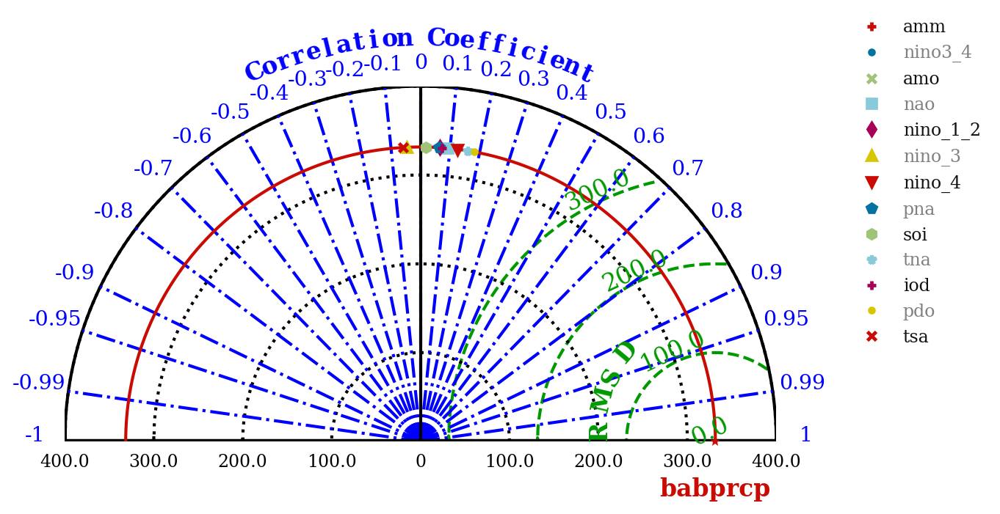

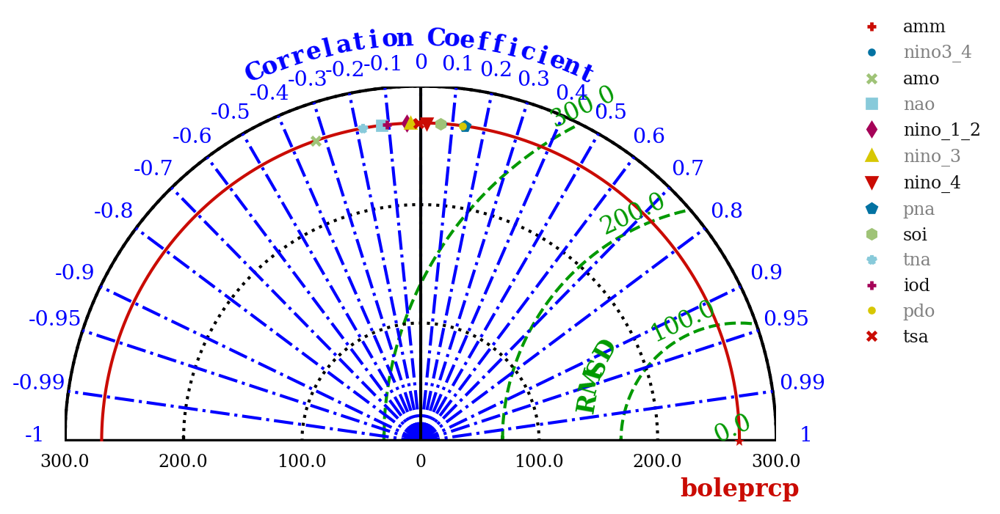

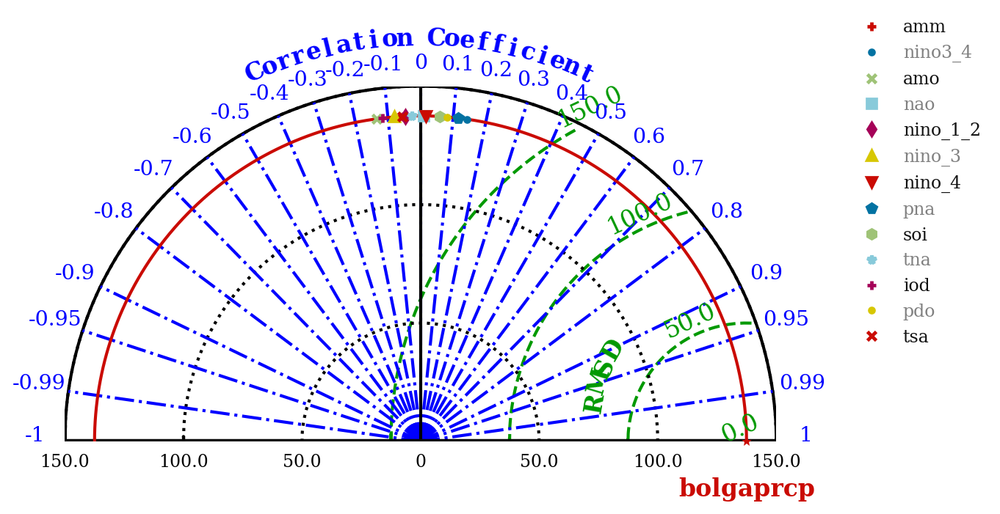

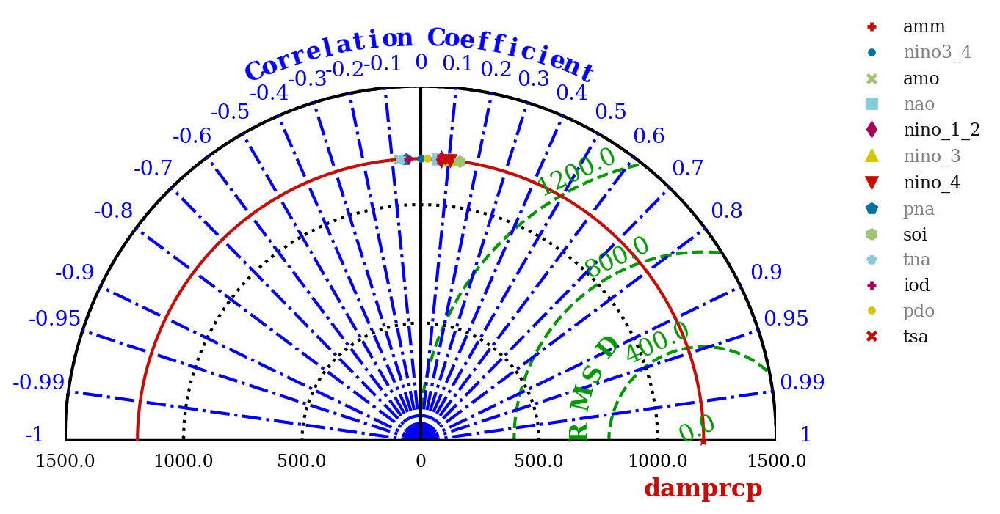

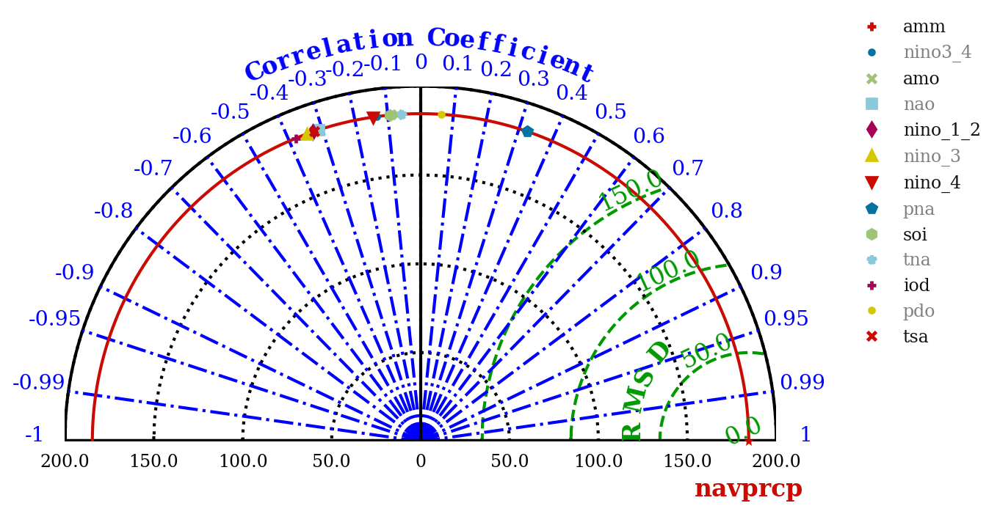

...

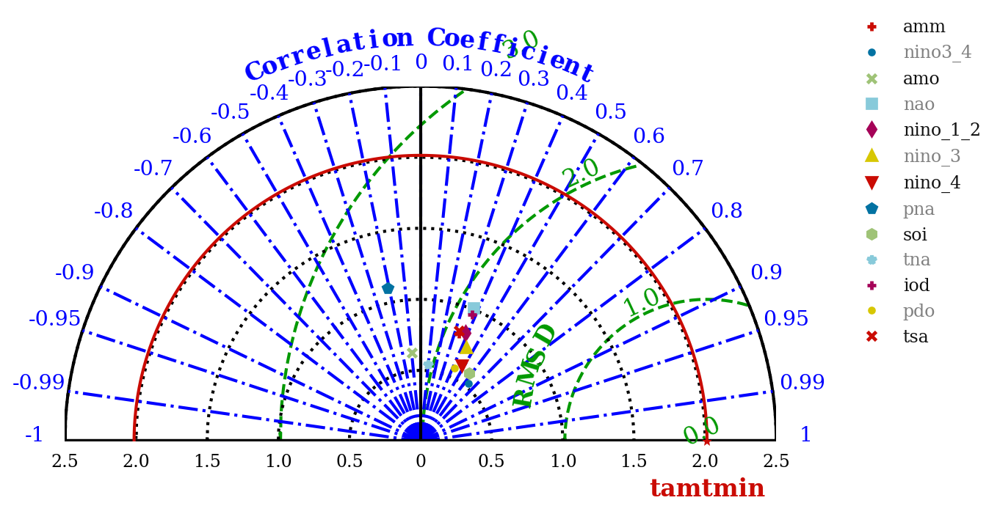

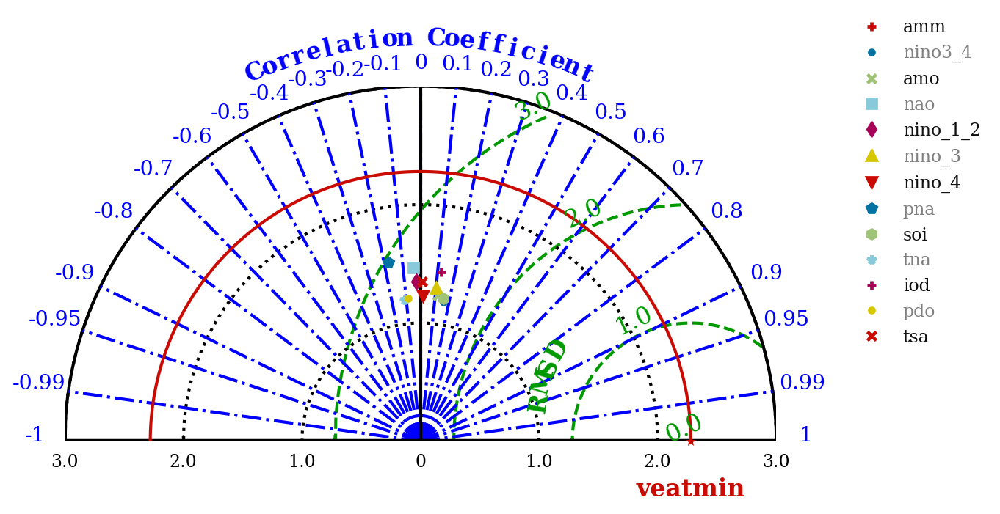

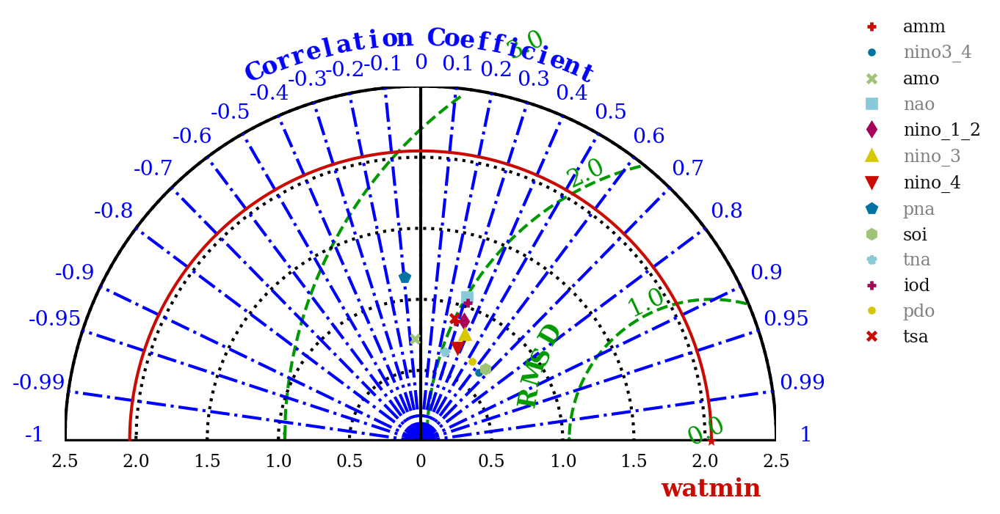

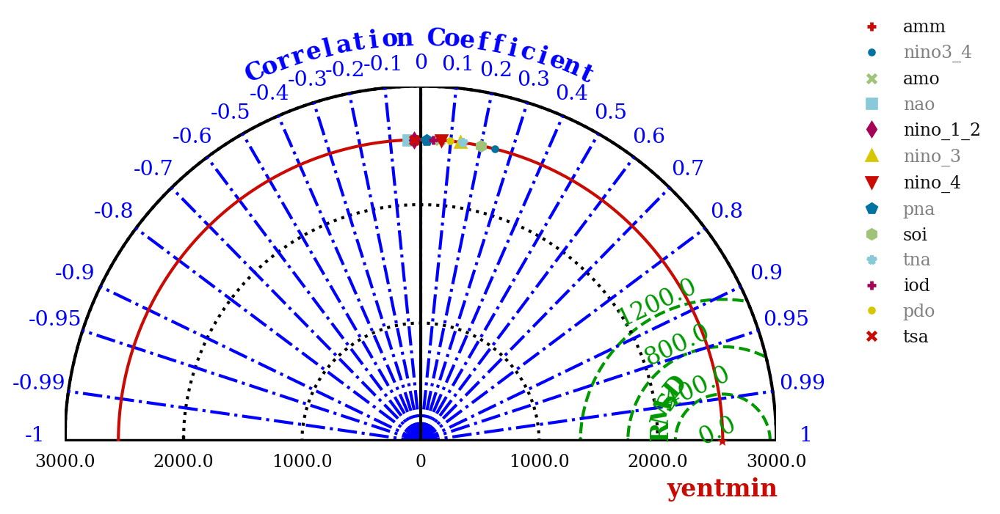

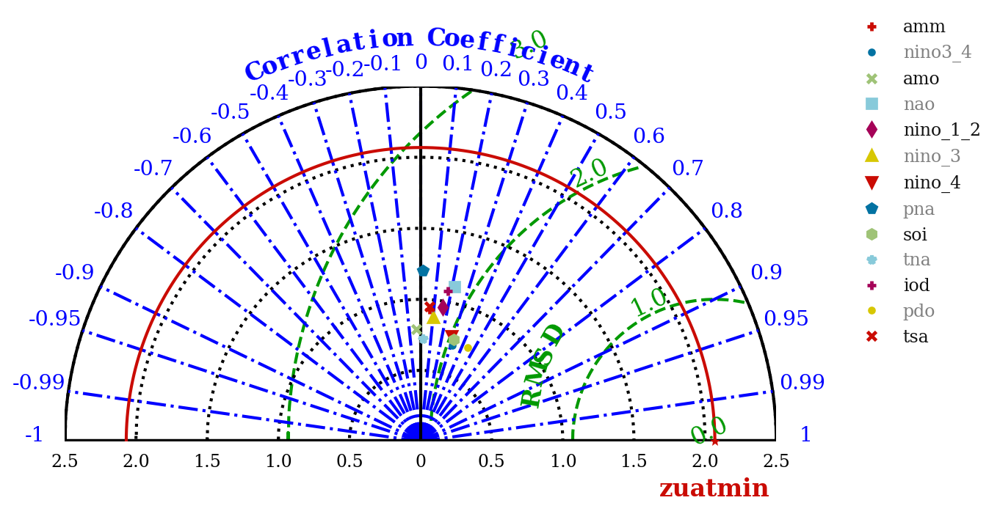

In [210]:
import skill_metrics as sm

'''
    Specify individual marker label (key), label color, symbol, size, symbol face color, 
    symbol edge color
    '''
Nz = 5
MARKERS = {
        f"{gk.columns[0]}": {
            "labelColor": "k",
            "symbol": "+",
            "size": Nz,
            "faceColor": "r",
            "edgeColor": "r",
        },
        f"{gk.columns[1]}": {
            "labelColor": "gray",
            "symbol": ".",
            "size": Nz,
            "faceColor": "b",
            "edgeColor": "b",
        },
        f"{gk.columns[2]}": {
            "labelColor": "k",
            "symbol": "x",
            "size": Nz,
            "faceColor": "g",
            "edgeColor": "g",
        },
        f"{gk.columns[3]}": {
            "labelColor": "gray",
            "symbol": "s",
            "size": Nz,
            "faceColor": "c",
            "edgeColor": "c",
        },
        f"{gk.columns[4]}": {
            "labelColor": "k",
            "symbol": "d",
            "size": Nz,
            "faceColor": "m",
            "edgeColor": "m",
        },
        f"{gk.columns[5]}": {
            "labelColor": "gray",
            "symbol": "^",
            "size": Nz,
            "faceColor": "y",
            "edgeColor": "y",
        },
        f"{gk.columns[6]}": {
            "labelColor": "k",
            "symbol": "v",
            "size": Nz,
            "faceColor": "r",
            "edgeColor": "r",
        },
        f"{gk.columns[7]}": {
            "labelColor": "gray",
            "symbol": "p",
            "size": Nz,
            "faceColor": "b",
            "edgeColor": "b",
        },
        f"{gk.columns[8]}": {
            "labelColor": "k",
            "symbol": "h",
            "size": Nz,
            "faceColor": "g",
            "edgeColor": "g",
        },
        f"{gk.columns[9]}": {
            "labelColor": "gray",
            "symbol": "*",
            "size": Nz,
            "faceColor": "c",
            "edgeColor": "c",
        },
        f"{gk.columns[10]}": {
            "labelColor": "k",
            "symbol": "+",
            "size": Nz,
            "faceColor": "m",
            "edgeColor": "m",
        },
        f"{gk.columns[11]}": {
            "labelColor": "gray",
            "symbol": ".",
            "size": Nz,
            "faceColor": "y",
            "edgeColor": "y",
        },
        f"{gk.columns[12]}": {
            "labelColor": "k",
            "symbol": "x",
            "size": Nz,
            "faceColor": "r",
            "edgeColor": "r",
        },
        f"{gk.columns[13]}": {
            "labelColor": "gray",
            "symbol": "*",
            "size": Nz,
            "faceColor": "y",
            "edgeColor": "y",
        },
# ,
#         "16059": {
#             "labelColor": "k",
#             "symbol": "d",
#             "size": 9,
#             "faceColor": "g",
#             "edgeColor": "g",
#         },
#         "16060": {
#             "labelColor": "gray",
#             "symbol": "^",
#             "size": 9,
#             "faceColor": "c",
#             "edgeColor": "c",
#         },
#         "16066": {
#             "labelColor": "k",
#             "symbol": "v",
#             "size": 9,
#             "faceColor": "m",
#             "edgeColor": "m",
#         },
#         "16091": {
#             "labelColor": "gray",
#             "symbol": "p",
#             "size": 9,
#             "faceColor": "y",
#             "edgeColor": "y",
#         },
#         "17338": {
#             "labelColor": "k",
#             "symbol": "h",
#             "size": 9,
#             "faceColor": "r",
#             "edgeColor": "r",
#         },
#         "17364": {
#             "labelColor": "gray",
#             "symbol": "*",
#             "size": 9,
#             "faceColor": "b",
#             "edgeColor": "b",
#         },
#         "17365": {
#             "labelColor": "k",
#             "symbol": "+",
#             "size": 9,
#             "faceColor": "g",
#             "edgeColor": "g",
#         },
#         "17437": {
#             "labelColor": "gray",
#             "symbol": ".",
#             "size": 9,
#             "faceColor": "c",
#             "edgeColor": "c",
#         },
    }

for i, ck in enumerate([
           'babprcp',
           'boleprcp',
           'bolgaprcp',
           'damprcp',
           'navprcp',            
           'tamprcp',
           'veaprcp',
           'waprcp',        
           'yenprcp',
           'zuaprcp',
           'babtmax',
           'boletmax',
           'bolgatmax',
           'damtmax',
           'navtmax',
           'tamtmax',
           'veatmax',
           'watmax',
           'yentmax',
           'zuatmax',
           'babtmin',
           'boletmin',
           'bolgatmin',
           'damtmin',
           'navtmin',
           'tamtmin',
           'veatmin',         
           'watmin',           
           'yentmin',          
           'zuatmin',         
          ]):
    yt = df[ck]


    ss = [co_standard_deviation(x_values=gk[c].values, y_values=yt) for c in list(gk.columns)]
    aa = [centered_root_mean_square_difference(x_values=gk[c].values, y_values=yt) for c in list(gk.columns)]
    cc = [correlation_coefficient(x_values=gk[c].values, y_values=yt) for c in list(gk.columns)]
    ss = np.array(ss)
    aa = np.array(aa)
    cc = np.array(cc)
    
    plt.figure(num=i+1, figsize=(12,8), dpi=170)
    if ck in ['babprcp', 'zuaprcp', 'boleprcp', ]:
        Trms = [0.0, 100.0, 200.0, 300.0]
    elif ck in ['bolgaprcp', 'navprcp', 'tamprcp', 'waprcp', 'yenprcp']:
        Trms = [0.0, 50.0, 100.0, 150.0]
    elif ck in ['damprcp', 'veaprcp', 'yentmin']:
        Trms = [0.0, 400.0, 800.0, 1200.0]
    elif ck in ['yentmin']:
        Trms = [0.0, 700.0, 1400.0, 2100.0]
    else:
        Trms = [0.0, 1.0, 2.0, 3.0]
    
    ax = sm.taylor_diagram(ss, aa, cc, 
                           markers = MARKERS, 
                           markerLegend = 'on',
                           styleOBS = '-',
                           markerSymbol='*', 
                           titleOBS=f'{ck}', 
                           colOBS='r',
                           markerobs='*',
                           tickRMS = Trms,
                           tickRMSangle = 115, 
                           showlabelsRMS = 'on',
                          titleRMS = 'on',)
  
    # Show the plot
    plt.grid(False)
    # Save the figure as a PDF with higher resolution 
    plt.savefig(f'{ck}_td.pdf', dpi=300, bbox_inches='tight', pad_inches=0.1, transparent=True)
    plt.savefig(f'{ck}_td.png', dpi=300, bbox_inches='tight', pad_inches=0.1, transparent=True)
    plt.show()

In [ ]:
!ls

In [ ]:
import matplotlib.font_manager

# List available fonts
available_fonts = [f.name for f in matplotlib.font_manager.fontManager.ttflist]
print(available_fonts)

In [ ]:
plt.rcParams['font.family'] = 'DejaVu Serif'

In [ ]:
# ck = ['veaprcp',
#           'veatmax',
#           'veatmin',
#           'waprcp',
#           'watmax',
#           'watmin', 
#           'yenprcp',
#           'yentmax',
#           'yentmin',
#           'zuaprcp', 
#           'zuatmax',
#           'zuatmin',
#           'tamprcp',
#           'tamtmax',
#           'tamtmin',
#           'bolgaprcp',
#           'bolgatmax',
#           'bolgatmin',
#           'boleprcp',
#           'boletmax', 
#           'boletmin',
#           'babprcp',
#           'babtmax',
#           'babtmin', 
#           'navprcp',
#           'navtmax', 
#           'navtmin',
#           'damprcp', 
#           'damtmax',
#           'damtmin']